In [3]:
import scanpy as sc
import anndata as ad
import cellanova as cnova
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
import matplotlib.ticker as ticker
mpl.rcParams['font.family'] = 'Arial'
figpath = 'figure-12.9'
#find the best params
def clu(adata, key_added="majorType-fix", n_neighbors=50, n_pcs=30, rep='X_pca_harmony', do_har=False, max_iter=20, do_scrublet=False, har_key='batch', resolution=1):
    # Computing the neighborhood graph
    if do_scrublet:
        n0 = adata.shape[0]
        print("{0} Cell number: {1}".format(key_added, n0))
        sc.external.pp.scrublet(adata)
        adata = adata[adata.obs['predicted_doublet']==False,:].copy()
        print("{0} Cells retained after scrublet, {1} cells reomved.".format(adata.shape[0], n0-adata.shape[0]))
    else:
        print("Ignoring processing doublet cells...")
    # sc.pp.pca(adata, svd_solver='arpack', use_highly_variable=True)
    if do_har and len(adata.obs[har_key].cat.categories) > 1:
        sc.external.pp.harmony_integrate(adata, key=har_key,max_iter_harmony=max_iter)
        sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, use_rep=rep)
    else:
        print("Evaluating neighbors only...")
        sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, use_rep=rep)
    # Run UMAP
    sc.tl.umap(adata)
    sc.tl.leiden(adata, resolution=resolution, key_added=key_added)
    sc.pl.umap(adata, color=key_added, legend_fontoutline=True, palette=sc.pl.palettes.default_20, legend_loc="on data")
    return adata

/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build dependencies
   which are reliably pre-installed before running the build tools

  warnings.warn(


In [38]:
adata_concat = sc.read_h5ad('adata-epi-concat-12.6.h5ad')
adata_concat

/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 76216 × 17269
    obs: 'batch', 'age', 'majorType-fix', 'IHC', 'study', 'annotation'
    var: 'n_cells-Non-young', 'highly_variable-Non-young', 'means-Non-young', 'dispersions-Non-young', 'dispersions_norm-Non-young', 'type-Non-young', 'n_cells_by_counts-Young', 'mean_counts-Young', 'log1p_mean_counts-Young', 'pct_dropout_by_counts-Young', 'total_counts-Young', 'log1p_total_counts-Young', 'n_cells-Young', 'highly_variable-Young', 'means-Young', 'dispersions-Young', 'dispersions_norm-Young', 'symbol-Young', 'ensg-Young', 'chromosome-Young', 'start-Young', 'end-Young', 'n_cells_by_counts-Young-inter', 'mean_counts-Young-inter', 'log1p_mean_counts-Young-inter', 'pct_dropout_by_counts-Young-inter', 'total_counts-Young-inter', 'log1p_total_counts-Young-inter', 'n_cells-Young-inter', 'highly_variable-Young-inter', 'means-Young-inter', 'dispersions-Young-inter', 'dispersions_norm-Young-inter', 'type-Young-inter', 'ID-Young-inter', 'name-Young-inter', 'high

In [3]:
def anno(adata:ad.AnnData, annoDict:dict, obsKey='cnv_status', obsVal='cnv_leiden', default="Unknown"):
  if default is not None:
    adata.obs[obsKey] = default
  for key in annoDict.keys():
    adata.obs.loc[adata.obs[obsVal].isin(annoDict[key]), obsKey] = key
  return adata

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


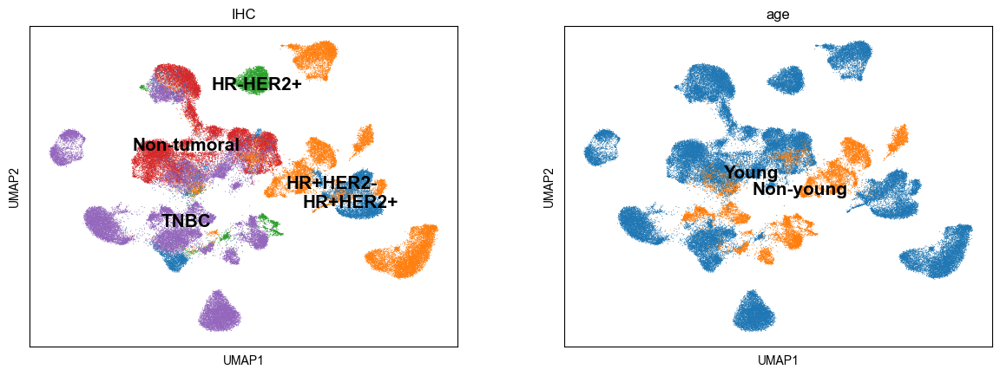

In [19]:
annoDict = {
  'Non-tumoral': ['5N', '6N', '10N', '12N', '16N'],
  'TNBC': ['1T', '2T', '3T', '8T', '9T', 'CID44991', 'CID4513', 'CID4523', 'CID44971', 'CID4495', 'CID4465','CID44041','CID3946','GSM4909288_TNB1_0177', 'GSM4909287_TNB1_0554', 'GSM4909285_TNB1_4031', 'CID4515'],
  'HR+HER2-': ['5T', '6T', '10T', '15T', 'CID4535', 'CID4067', 'CID4463', 'CID4530N', 'CID4471', 'CID3948','CID4290A','CID4461','CID3941','CID3963','CID4040','CID4398',],
  'HR+HER2+': ['20T', '21T', '22T', 'CID4066', 'CID3586',],
  'HR-HER2+': ['17T', 'CID45171', 'CID3921','GSM4909289_HER2_0308'],
}
adata_concat = anno(adata_concat, annoDict, 'IHC', 'batch')
sc.pl.umap(adata_concat, color=['IHC', 'age'], size=2, legend_loc='on data', legend_fontsize=15)

In [18]:
adata_concat.obs.loc[adata_concat.obs['batch'].isin(['GSM4909288_TNB1_0177', 'GSM4909287_TNB1_0554', 'GSM4909285_TNB1_4031','GSM4909289_HER2_0308']), 'age'] = 'Young'

In [444]:
np.median(np.array(adata_concat[:,'CDH1'].X.todense()).flatten())

0.20395875

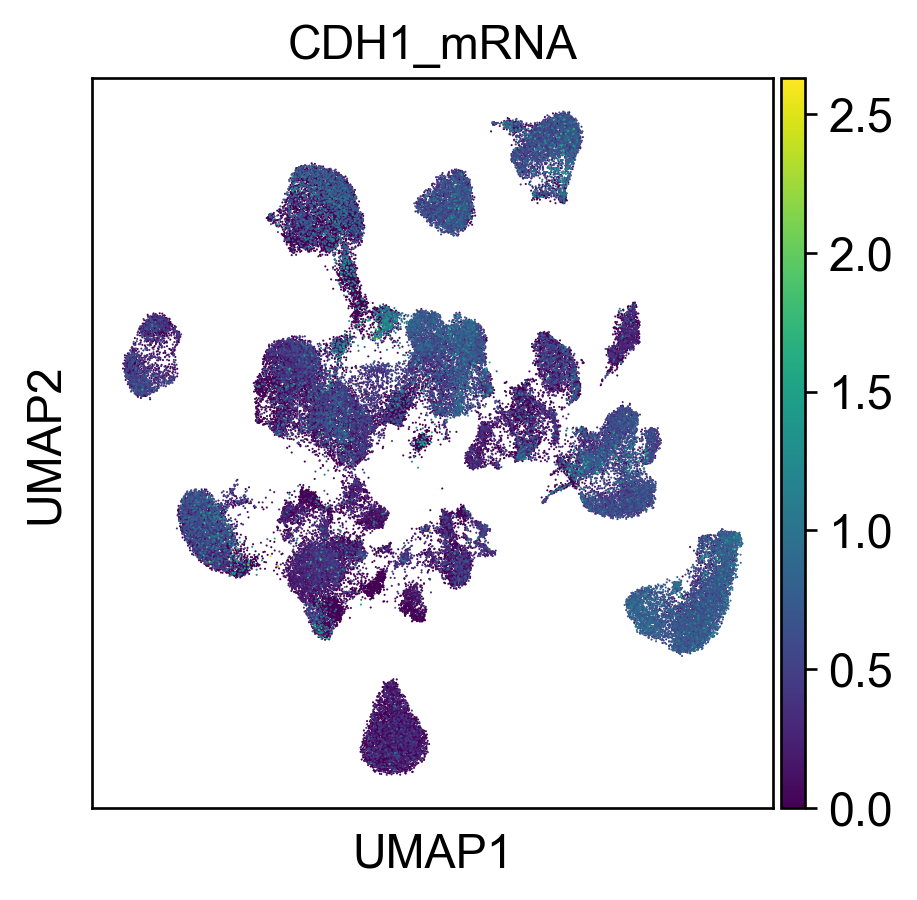

In [446]:
adata_concat.obs['CDH1_mRNA'] = np.array(adata_concat[:,'CDH1'].X.todense()).flatten()
CDH1_median = np.median(adata_concat.obs['CDH1_mRNA'])
adata_concat.obs['CDH1_attr'] = 1*(adata_concat.obs['CDH1_mRNA'] > CDH1_median)
sc.pl.umap(adata_concat, color=['CDH1_mRNA'])

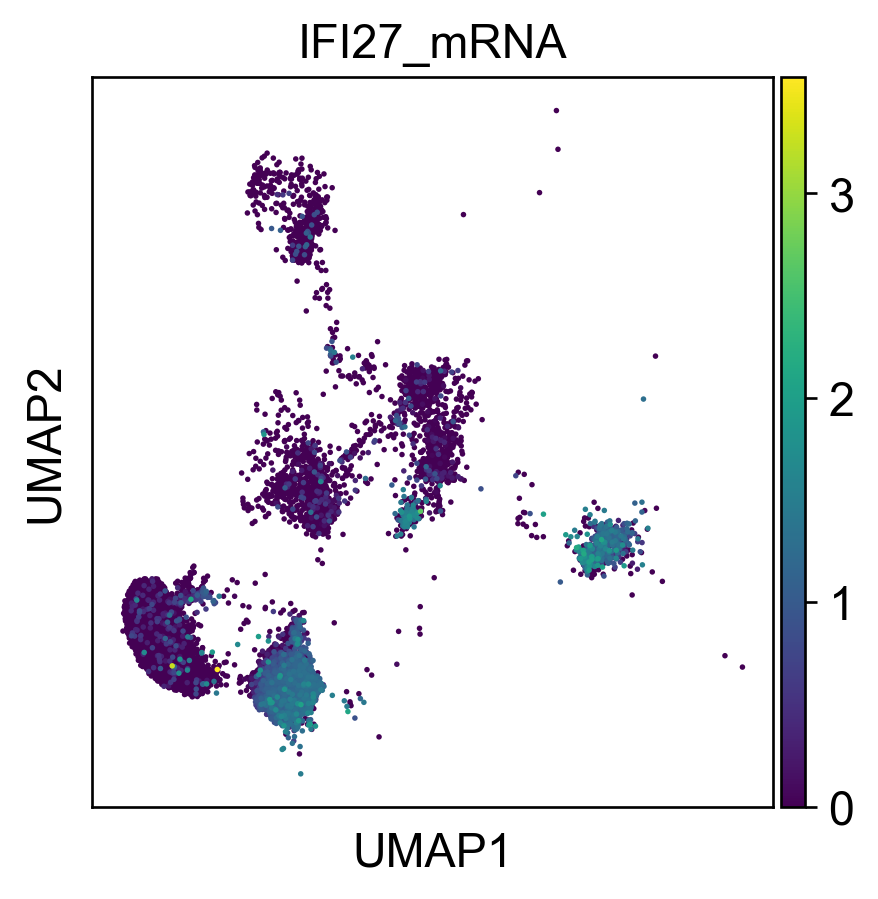

In [561]:
adata_IFI27.obs['IFI27_mRNA'] = np.array(adata_IFI27[:,'IFI27'].X.todense()).flatten()
IFI27_median = np.median(adata_IFI27.obs['IFI27_mRNA'])
adata_IFI27.obs['IFI27_attr'] = 1*(adata_IFI27.obs['IFI27_mRNA'] > IFI27_median)
sc.pl.umap(adata_IFI27, color=['IFI27_mRNA'])

In [559]:
adata_IFI27 = adata_concat[adata_concat.obs['batch'].isin(['2T', '8T', '9T', '13T','15T', '16N'])]

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


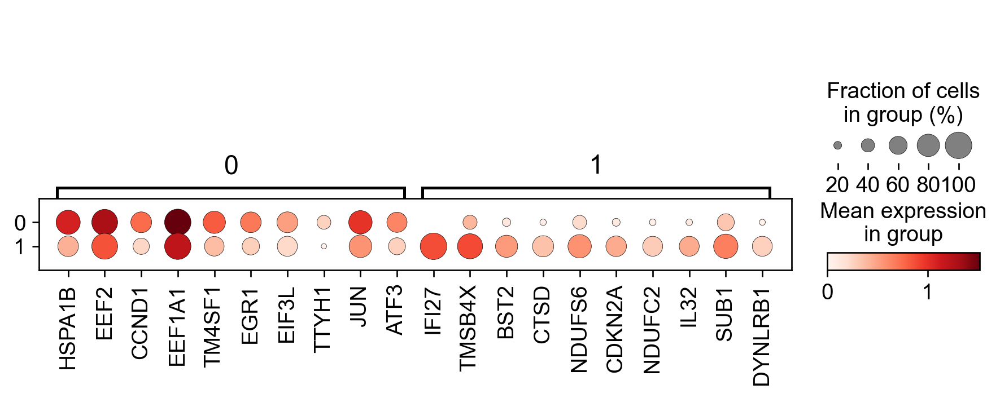

In [564]:
adata_IFI27.obs['IFI27_attr'] = adata_IFI27.obs['IFI27_attr'].astype('category')
sc.tl.rank_genes_groups(adata_IFI27, groupby='IFI27_attr')
sc.pl.rank_genes_groups_dotplot(adata_IFI27, groupby='IFI27_attr')

In [455]:
adata_concat.obs['CDH1_attr'] = adata_concat.obs['CDH1_attr'].astype("category")
adata_CDH1 = adata_concat.copy()

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:09)


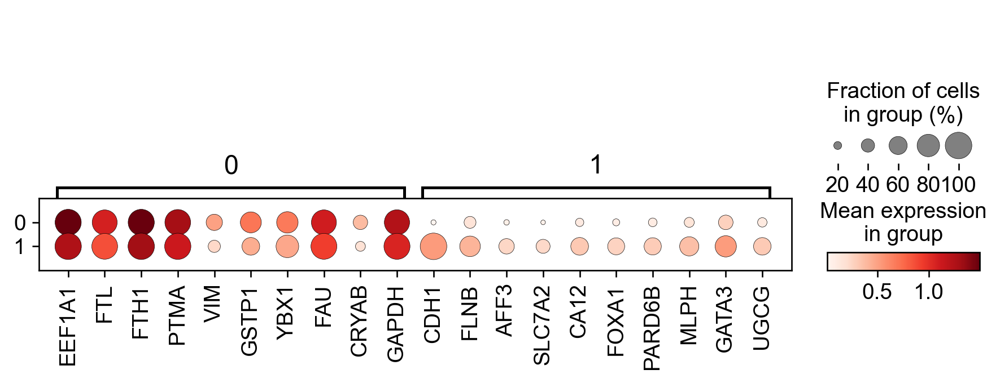

In [456]:
sc.tl.rank_genes_groups(adata_CDH1, groupby='CDH1_attr')
sc.pl.rank_genes_groups_dotplot(adata_CDH1, groupby='CDH1_attr')

In [457]:
import gseapy as gp

In [565]:
# get deg result
result = adata_IFI27.uns['rank_genes_groups']
groups = result['names'].dtype.names
degs = pd.DataFrame(
    {group + '_' + key: result[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
# subset up or down regulated genes
degs_sig = degs[degs['1_pvals_adj'] < 0.05]
degs_up = degs_sig[degs_sig['1_logfoldchanges'] > 0]
degs_dw = degs_sig[degs_sig['1_logfoldchanges'] < 0]

In [464]:
from gseapy import Msigdb
msig = Msigdb()
# mouse hallmark gene sets
gmt = msig.get_gmt(category='mh.all', dbver="2023.2.Hs")
gmt

In [566]:
enr_up = gp.enrichr(degs_up['1_names'],
                    gene_sets='KEGG_2021_Human',
                    outdir=None)
cc_up = gp.enrichr(degs_up['1_names'],
                    gene_sets='GO_Cellular_Component_2023',
                    outdir=None)
hm_up = gp.enrichr(degs_up['1_names'],
                    gene_sets=['MSigDB_Hallmark_2020'],
                    outdir=None)
mf_up = gp.enrichr(degs_up['1_names'],
                    gene_sets='GO_Molecular_Function_2023',
                    outdir=None)
bp_up = gp.enrichr(degs_up['1_names'],
                    gene_sets=['GO_Biological_Process_2023'],
                    outdir=None)

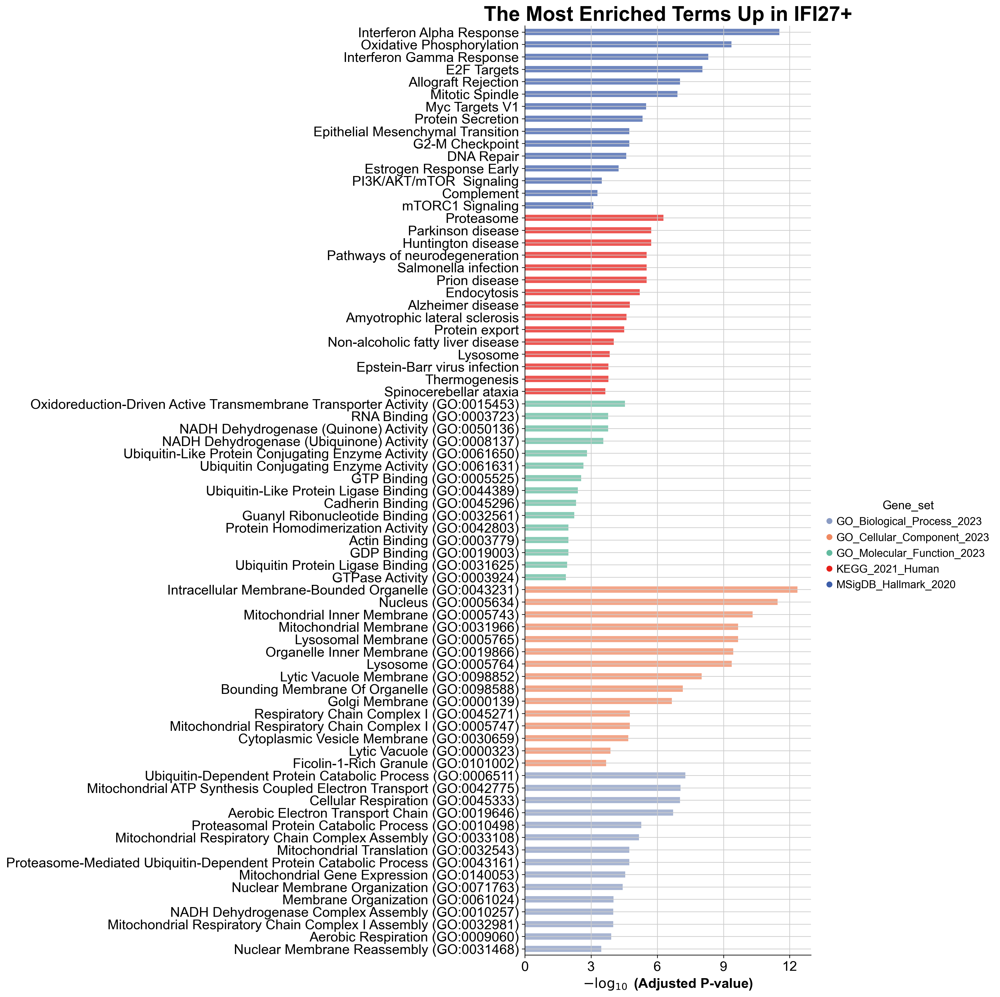

In [567]:
go_res = pd.concat([enr_up.res2d.head(15),hm_up.res2d.head(15), cc_up.res2d.head(15), bp_up.res2d.head(15), mf_up.res2d.head(15)])
ax = gp.barplot(go_res, figsize=(6,20),
                group ='Gene_set',
                top_term=15,
                color = ['#8b9cc4', '#f08961', '#62bb9f', '#e71f19', '#3d5eaa'],
                title ="The Most Enriched Terms Up in IFI27+")
ax.figure.savefig(f"figure-12.9/IFI27+_bar.svg")

In [568]:
enr_down = gp.enrichr(degs_up['0_names'],
                    gene_sets='KEGG_2021_Human',
                    outdir=None)
cc_down = gp.enrichr(degs_up['0_names'],
                    gene_sets='GO_Cellular_Component_2023',
                    outdir=None)
hm_down = gp.enrichr(degs_up['0_names'],
                    gene_sets=['MSigDB_Hallmark_2020'],
                    outdir=None)
mf_down = gp.enrichr(degs_up['0_names'],
                    gene_sets='GO_Molecular_Function_2023',
                    outdir=None)
bp_down = gp.enrichr(degs_up['0_names'],
                    gene_sets=['GO_Biological_Process_2023'],
                    outdir=None)

In [571]:
go_res.to_csv("figure-12.9/IFI27up_res.csv")
godown_res.to_csv("figure-12.9/IFI27down_res.csv")

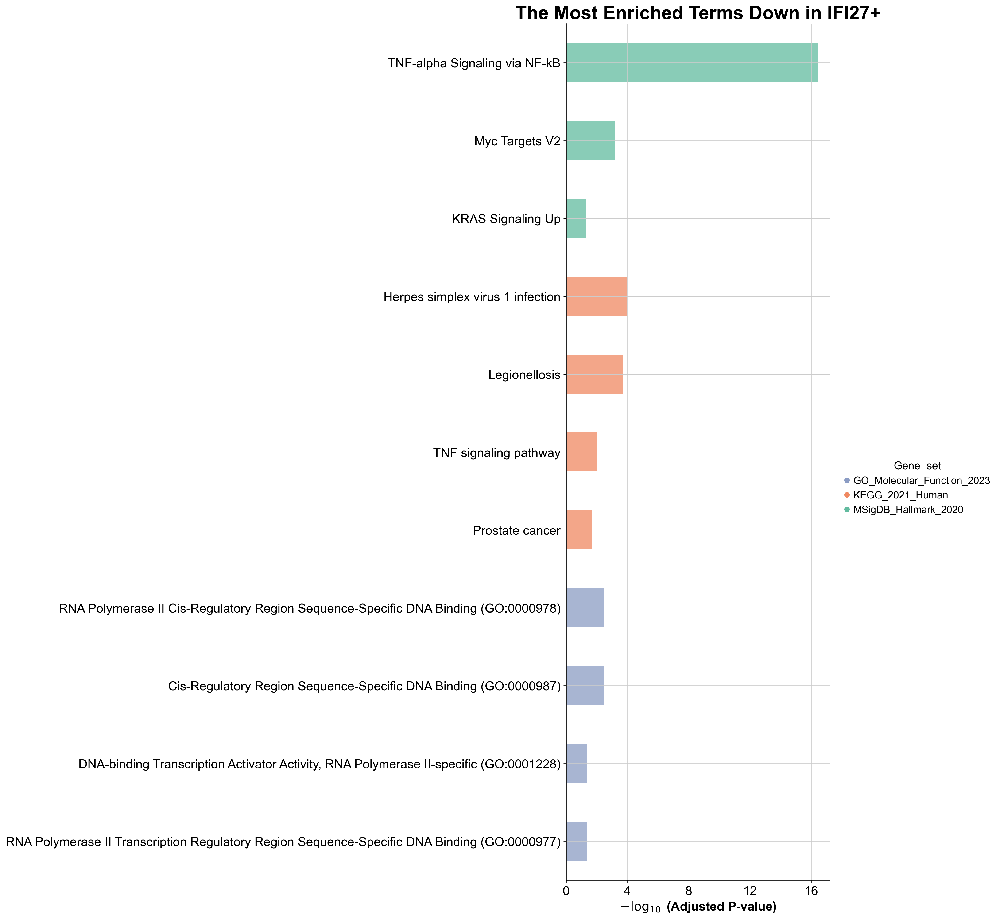

In [569]:
godown_res = pd.concat([enr_down.res2d.head(15),hm_down.res2d.head(15), 
                    cc_down.res2d.head(15), bp_down.res2d.head(15), mf_down.res2d.head(15)])
ax = gp.barplot(godown_res, figsize=(6,20),
                group ='Gene_set',
                top_term=15,
                color = ['#8b9cc4', '#f08961', '#62bb9f', '#e71f19', '#3d5eaa'],
                title ="The Most Enriched Terms Down in IFI27+")
ax.figure.savefig(f"figure-12.9/IFI27-_bar.svg")

In [451]:
from scipy import stats

In [ ]:
adata_CDH1_hi = adata_concat[adata]

In [32]:
adata_concat.obs_names = [s.replace(f"-{s.split('-')[-1]}",'') for s in adata_concat.obs_names]

In [45]:
adata_epi_norm = sc.read_h5ad("adata-epi-norm-12.6.h5ad")
adata_epi_norm

AnnData object with n_obs × n_vars = 15756 × 39735
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'cnv_leiden', 'cnv_score', 'cnv_status', 'IHC', 'epi-leiden', 'epi-normtype'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'symbol', 'ensg', 'chromosome', 'start', 'end'
    uns: 'CellphoneDB', 'IHC_colors', 'batch_colors', 'cnv', 'cnv_leiden_colors', 'cnv_neighbors', 'cnv_status_colors', 'dendrogram_epi-leiden', 'dendrogram_leiden', 'epi-leiden_colors', 'epi-normtype_colors', 'epi-subtype_colors', 'gender_colors', 

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


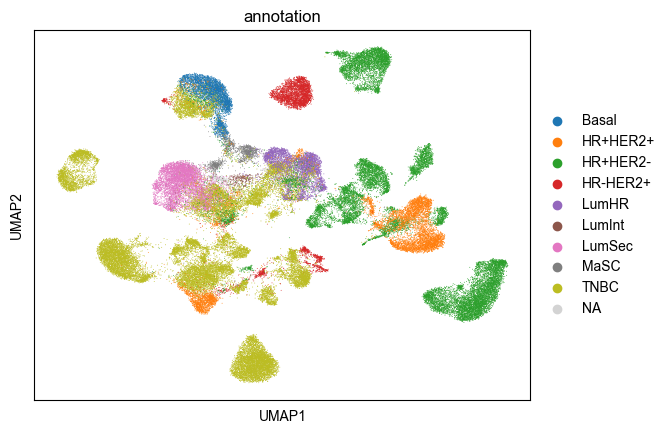

In [47]:
adata_concat.obs['annotation'] = adata_epi_norm.obs['epi-normtype']
adata_concat.obs['annotation'] = list(adata_concat.obs['annotation'])
annoDict = {
  'TNBC': ['1T', '2T', '3T', '8T', '9T', 'CID44991', 'CID4513', 'CID4523', 'CID44971', 'CID4495', 'CID4465','CID44041','CID3946','GSM4909288_TNB1_0177', 'GSM4909287_TNB1_0554', 'GSM4909285_TNB1_4031', 'CID4515'],
  'HR+HER2-': ['5T', '6T', '10T', '15T', 'CID4535', 'CID4067', 'CID4463', 'CID4530N', 'CID4471', 'CID3948','CID4290A','CID4461','CID3941','CID3963','CID4040','CID4398',],
  'HR+HER2+': ['20T', '21T', '22T', 'CID4066', 'CID3586',],
  'HR-HER2+': ['17T', 'CID45171', 'CID3921','GSM4909289_HER2_0308'],
}
adata_concat = anno(adata_concat, annoDict, 'annotation', 'batch', default=None)
sc.pl.umap(adata_concat, color=['annotation'])

In [51]:
adata_concat = adata_concat[adata_concat.obs['annotation'].isin(['TNBC', 'LumHR', 'LumSec', 'Basal', 'MaSC', 'LumInt', 'HR+HER2-', 'HR-HER2+', 'HR+HER2+'])]

In [4]:
# 2024.12.22
adata_concat = sc.read_h5ad('adata-epi-concat-12.17.h5ad')

/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


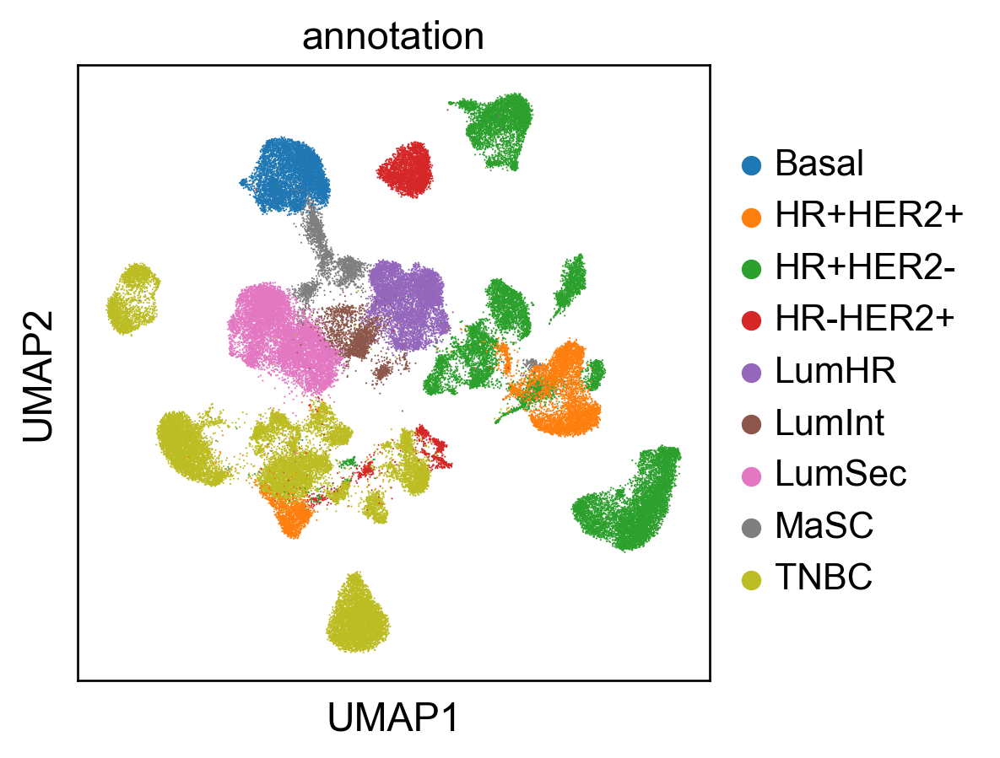

In [82]:
sc.pl.umap(adata_concat, color=['annotation'])

In [ ]:
# 2025.1.2 correlation_matrix
samples = adata_concat.obs['batch'].cat.categories
norm_type = ['LumSec','LumHR', 'LumInt', 'Basal', 'MaSC',]
corr_mat = pd.DataFrame(columns=norm_type)
for s in samples:
  if s not in ['5N', '6N', '10N', '12N', '16N']:
    adata_temp = adata_concat[(adata_concat.obs['batch'] == s) | adata_concat.obs['annotation'].isin(norm_type), :]
    sc.tl.dendrogram(adata_temp, groupby='annotation')
    cat_ordered = adata_temp.uns['dendrogram_annotation']['categories_ordered']
    corr_df = pd.DataFrame(adata_temp.uns['dendrogram_annotation']['correlation_matrix'], index=cat_ordered, columns=cat_ordered)
    subtype = [x for x in cat_ordered if x not in norm_type]
    if len(subtype) == 0:
      print(f"No specific epithelial for sample: {s}.")
      continue
    else:
      subtype = subtype[0]
      corr = corr_df.loc[subtype, norm_type]
      corr_mat.loc[s, :] = corr
corr_mat

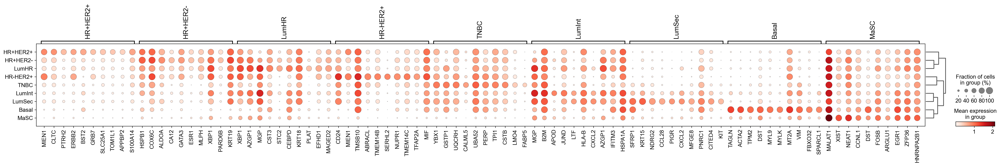

In [268]:
sc.pl.rank_genes_groups_dotplot(adata_concat, groupby='annotation')

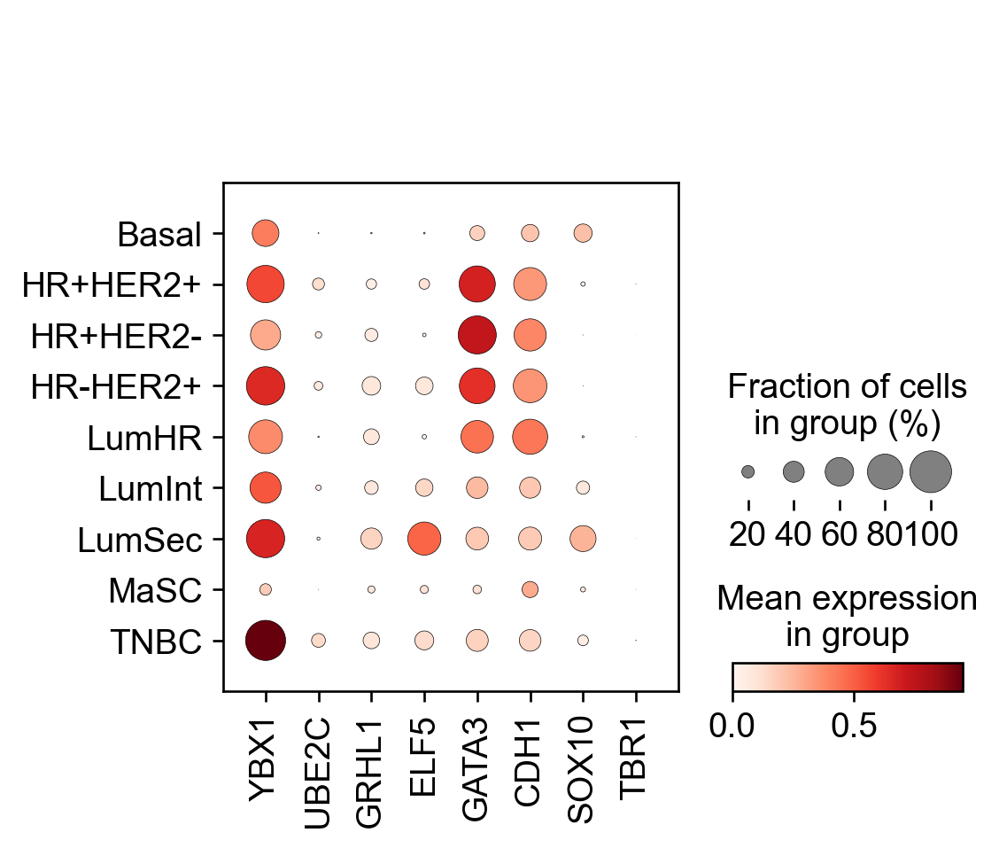

In [269]:
sc.pl.dotplot(adata_concat, groupby='annotation', var_names=['YBX1', 'UBE2C', 'GRHL1', 'ELF5', 'GATA3', 'CDH1', 'SOX10', 'TBR1'])

In [250]:
import torch
import torch.utils.data as Data
import torch.nn as nn
import torch.nn.functional as F
from sklearn.preprocessing import MinMaxScaler
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

Using cuda device


In [251]:
# hyperparams
learning_rate=1e-3
num_epochs=1000
batch_size=1024
epoch_thresh=1e-7

In [252]:
class VAE(nn.Module):
    def __init__(self, count_size = 3000, h_dim=400, z_dim=20):
        super(VAE, self).__init__()
        self.z_dim = z_dim
        self.fc1 = nn.Linear(count_size, h_dim)
        self.fc2 = nn.Linear(h_dim, z_dim)  # 均值 向量
        self.fc3 = nn.Linear(h_dim, z_dim)  # 保准方差 向量
        self.fc4 = nn.Linear(z_dim, h_dim)
        self.fc5 = nn.Linear(h_dim, count_size)

    # 编码过程
    def encode(self, x):
        h = F.relu(self.fc1(x))
        return self.fc2(h), self.fc3(h)

    # 随机生成隐含向量
    def reparameterize(self, mu, log_var):
        std = torch.exp(log_var / 2)
        eps = torch.randn_like(std)
        return mu + eps * std

    # 解码过程
    def decode(self, z):
        h = F.relu(self.fc4(z))
        return torch.sigmoid(self.fc5(h))

    # 整个前向传播过程：编码-》解码
    def forward(self, x):
        mu, log_var = self.encode(x)
        z = self.reparameterize(mu, log_var)
        x_reconst = self.decode(z)
        return x_reconst, mu, log_var

In [253]:
adata_train = adata_concat[:,adata_concat.var['highly_variable']].copy()
adata_train_LumHR = adata_concat[adata_concat.obs['annotation'] == 'LumHR']
adata_train_LumSec = adata_concat[adata_concat.obs['annotation'] == 'LumSec']
adata_train_Basal = adata_concat[adata_concat.obs['annotation'] == 'Basal']
adata_train_MaSC = adata_concat[adata_concat.obs['annotation'] == 'MaSC']
adata_train_LumInt = adata_concat[adata_concat.obs['annotation'] == 'LumInt']

In [404]:
from torch.utils.data import random_split
adata_train = adata_train_LumHR[:,adata_train_LumHR.var['highly_variable']].copy()
adata_normal = adata_train
count_size = len(adata_normal.var_names)
scdataset = adata_normal.X.todense()
scdataset = np.asarray(scdataset)
# scaler = MinMaxScaler()
# scdataset = scaler.fit_transform(scdataset)
dataset = torch.from_numpy(np.array(scdataset))
train_len = int(0.8 * len(dataset))
valid_len = len(dataset) - train_len
train_dataset, valid_dataset = random_split(dataset, [train_len, valid_len])
train_loader = Data.DataLoader(dataset=train_dataset,
                              batch_size=len(train_dataset),
                              shuffle=True)
valid_loader = Data.DataLoader(dataset=valid_dataset,
                              batch_size=len(valid_dataset),
                              shuffle=True)
nmodel = VAE(count_size=count_size, h_dim=512, z_dim=128).to(device)
optimizer_n = torch.optim.Adam(nmodel.parameters(), lr=0.005)

In [405]:
num_epochs=1000
for epoch in range(num_epochs):
    kl_divs = []
    for i, x in enumerate(train_loader):
        x = x.to(device).view(-1, count_size)
        x_reconst, mu, log_var = nmodel(x)

        reconst_loss = F.mse_loss(x_reconst, x, reduction='mean')
        kl_div = - 0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())

        loss = reconst_loss + kl_div
        optimizer_n.zero_grad()
        loss.backward()
        optimizer_n.step()

        kl_divs.append(kl_div)
    if epoch % 20 == 0 and epoch > 0:
        # validation
        for i, x in enumerate(valid_loader):
            x = x.to(device).view(-1, count_size)
            x_reconst, mu, log_var = nmodel(x)
            reconst_loss = F.mse_loss(x_reconst, x, reduction='mean')
            kl_div = - 0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())
            vloss = reconst_loss + kl_div

        print("Epoch[{}/{}] Train Loss: {}, Valid Loss: {}"
                .format(epoch, num_epochs, loss.item(), vloss.item()))
    # if sum(kl_divs) < epoch_thresh:
    #     break
print("Epoch has reach an end.")

Epoch[20/1000] Train Loss: 190.51788330078125, Valid Loss: 43.08403396606445
Epoch[40/1000] Train Loss: 11.98491382598877, Valid Loss: 2.6192245483398438
Epoch[60/1000] Train Loss: 2.0334599018096924, Valid Loss: 0.4789527356624603
Epoch[80/1000] Train Loss: 0.28693944215774536, Valid Loss: 0.0746053084731102
Epoch[100/1000] Train Loss: 0.04371940717101097, Valid Loss: 0.021848388016223907
Epoch[120/1000] Train Loss: 0.019758228212594986, Valid Loss: 0.015555571764707565
Epoch[140/1000] Train Loss: 0.01683853566646576, Valid Loss: 0.015324406325817108
Epoch[160/1000] Train Loss: 0.01693681627511978, Valid Loss: 0.014595056883990765
Epoch[180/1000] Train Loss: 0.01657373085618019, Valid Loss: 0.014780417084693909
Epoch[200/1000] Train Loss: 0.01290167961269617, Valid Loss: 0.014266110956668854
Epoch[220/1000] Train Loss: 0.017610380426049232, Valid Loss: 0.015062539838254452
Epoch[240/1000] Train Loss: 0.013635906390845776, Valid Loss: 0.01381848007440567
Epoch[260/1000] Train Loss: 0.0

In [401]:
adata_young = adata_concat[adata_concat.obs['age']=='Young',adata_concat.var['highly_variable']].copy()
adata_old = adata_concat[adata_concat.obs['age']=='Non-young',adata_concat.var['highly_variable']].copy()
adata_young_TNBC = adata_young[adata_young.obs['annotation']=='TNBC',:].copy()
adata_old_TNBC = adata_old[adata_old.obs['annotation']=='TNBC',:].copy()
adata_TNBC = adata_concat[adata_concat.obs['annotation']=='TNBC',adata_concat.var['highly_variable']].copy()

In [406]:
adata_HR = adata_concat[adata_concat.obs['annotation'].isin(['HR+HER2-', 'HR+HER2+']),adata_concat.var['highly_variable']].copy()

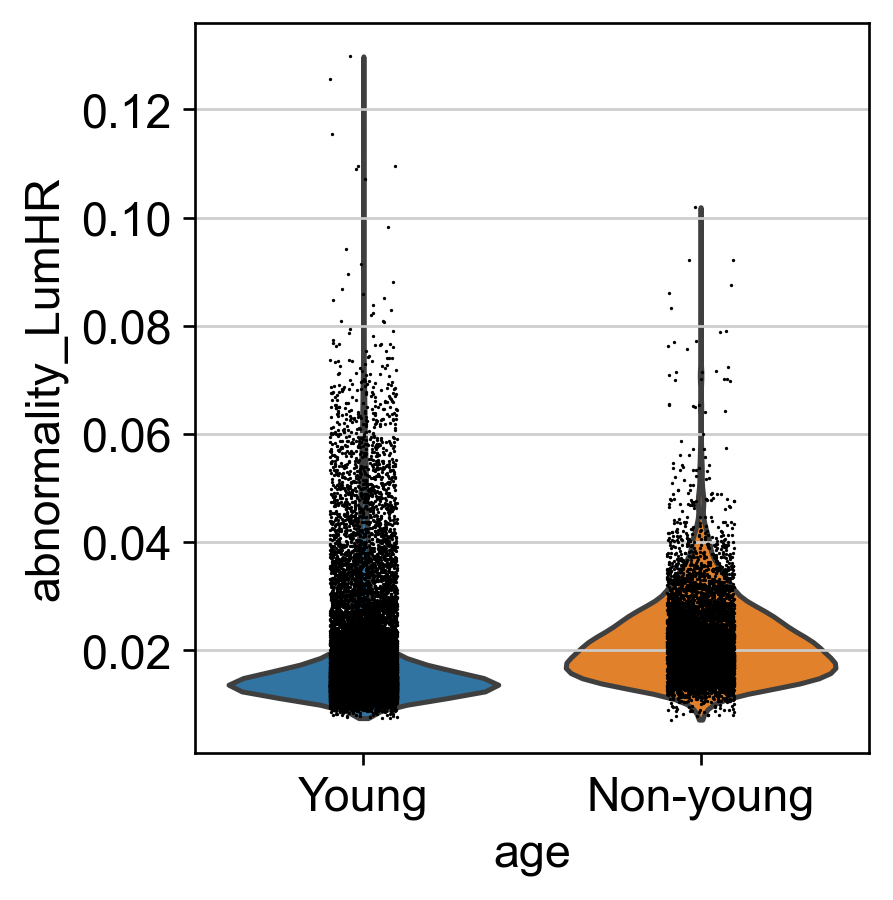

In [407]:
scdataset = adata_HR.X.todense()
scdataset = np.asarray(scdataset)
# scaler = MinMaxScaler()
# scdataset = scaler.fit_transform(scdataset)
dataset = torch.from_numpy(np.array(scdataset))
data_loader = Data.DataLoader(dataset=dataset,
                              batch_size=1,
                              shuffle=False)
losses = np.zeros(len(adata_HR))
with torch.no_grad():
    for i, x in enumerate(data_loader):
        x = x.to(device).view(-1, count_size)
        out, mu, log_var = nmodel(x)
        reconst_loss = F.mse_loss(out, x, reduction='mean')
        kl_div = - 0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())

        loss = reconst_loss + kl_div
        loss = loss.cpu().numpy()
        losses[i] = loss
adata_HR.obs['abnormality_LumHR'] = losses
sc.pl.violin(adata_HR, 'abnormality_LumHR', 'age')

In [423]:
from scipy.stats import mannwhitneyu
import scipy.stats as stats
adata_HR.obs['abnormality_LumHR'] = stats.zscore(adata_HR.obs['abnormality_LumHR'])
group_young = adata_HR.obs.loc[adata_HR.obs['age']=='Young', 'abnormality_LumHR']
group_old = adata_HR.obs.loc[adata_HR.obs['age']=='Non-young', 'abnormality_LumHR']
stats.ranksums(group_old, group_young)

RanksumsResult(statistic=50.87295325669278, pvalue=0.0)

In [424]:
from scipy.stats import mannwhitneyu
import scipy.stats as stats
adata_TNBC.obs['abnormality_LumSec'] = stats.zscore(adata_TNBC.obs['abnormality_LumSec'])
group_young = adata_TNBC.obs.loc[adata_TNBC.obs['age']=='Young', 'abnormality_LumSec']
group_old = adata_TNBC.obs.loc[adata_TNBC.obs['age']=='Non-young', 'abnormality_LumSec']
stats.ranksums(group_old, group_young)

RanksumsResult(statistic=23.774671864492465, pvalue=6.107099303805222e-125)

In [419]:
from scipy.stats import mannwhitneyu
import scipy.stats as stats
group_young = adata_HR.obs.loc[adata_HR.obs['age']=='Young', 'abnormality_LumHR']
group_old = adata_HR.obs.loc[adata_HR.obs['age']=='Non-young', 'abnormality_LumHR']
stats.ranksums(group_old, group_young)

RanksumsResult(statistic=50.87295325669278, pvalue=0.0)

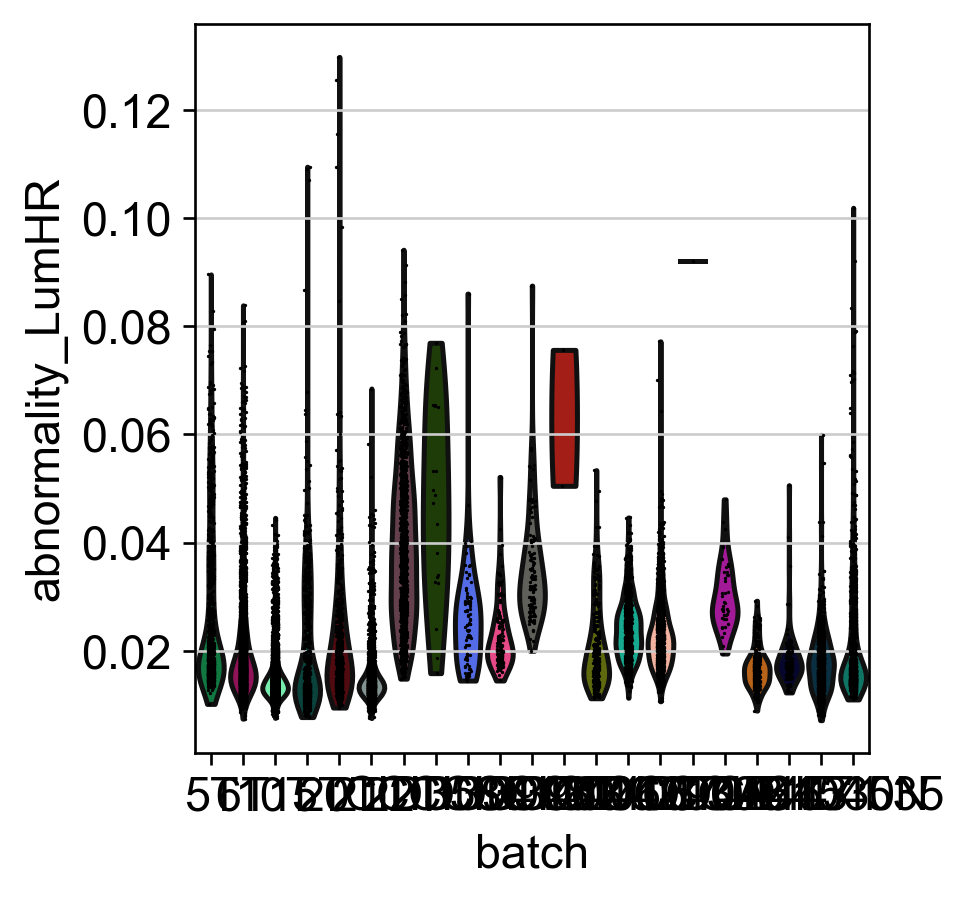

In [408]:
sc.pl.violin(adata_HR, 'abnormality_LumHR', 'batch')

In [294]:
from scipy.stats import spearmanr, pearsonr

In [310]:
# correlation matrix
cat = adata_concat.obs['annotation'].cat.categories
cat_len = len(cat)
correlation_matrix, pval_matrix = np.zeros((cat_len, cat_len)), np.zeros((cat_len, cat_len))
for i in range(len(cat)):
  x = np.array(adata_concat[adata_concat.obs['annotation'] == cat[i], adata_concat.var['highly_variable']].X.mean(axis=0))[0]
  for j in range(len(cat)):
    if len(adata_temp) > 0:
      y = np.array(adata_concat[adata_concat.obs['annotation'] == cat[j], adata_concat.var['highly_variable']].X.mean(axis=0))[0]
      correlation, p_value = pearsonr(x, y)
      correlation_matrix[i,j] = correlation
      pval_matrix[i,j] = p_value
corr_mt = pd.DataFrame(correlation_matrix, index=cat, columns=cat)
pval_mt = pd.DataFrame(pval_matrix, index=cat, columns=cat)
corr_mt

,Basal,HR+HER2+,HR+HER2-,HR-HER2+,LumHR,LumInt,LumSec,MaSC,TNBC
Basal,1.000000,0.514522,0.481205,0.396965,0.555414,0.684794,0.600933,0.742015,0.584022
HR+HER2+,0.514522,1.000000,0.848288,0.715959,0.774004,0.737939,0.630993,0.554801,0.726740
HR+HER2-,0.481205,0.848288,1.000000,0.748269,0.867372,0.749153,0.596541,0.620922,0.650517
HR-HER2+,0.396965,0.715959,0.748269,1.000000,0.709583,0.652492,0.570736,0.476127,0.725566
LumHR,0.555414,0.774004,0.867372,0.709583,1.000000,0.854007,0.707333,0.726532,0.662667
LumInt,0.684794,0.737939,0.749153,0.652492,0.854007,1.000000,0.848458,0.748278,0.759919
LumSec,0.600933,0.630993,0.596541,0.570736,0.707333,0.848458,1.000000,0.700910,0.738862
MaSC,0.742015,0.554801,0.620922,0.476127,0.726532,0.748278,0.700910,1.000000,0.559315
TNBC,0.584022,0.726740,0.650517,0.725566,0.662667,0.759919,0.738862,0.559315,1.000000


In [311]:
corr_mt.to_csv("figure-12.9/TableS10.csv")

In [ ]:
# batch correlation matrix
cat = adata_concat.obs['annotation'].cat.categories
cat_len = len(cat)
norm_type = ['LumSec','LumHR', 'LumInt', 'Basal', 'MaSC',]
bat = adata_concat.obs['batch'].cat.categories
correlation_matrix, pval_matrix = np.zeros((cat_len,len(bat))), np.zeros((cat_len,len(bat)))
for i in range(len(cat)):
  x = np.array(adata_concat[adata_concat.obs['annotation'] == cat[i], adata_concat.var['highly_variable']].X.mean(axis=0))[0]
  for j in range(len(bat)):
    if bat[j] not in ['5N', '6N', '10N', '12N', '16N']:
      adata_temp = adata_concat[~adata_concat.obs['annotation'].isin(norm_type) & np.array(adata_concat.obs['batch'] == bat[j]), adata_concat.var['highly_variable']]
      if len(adata_temp) > 0:
        print(f"{len(adata_temp)} specific epithelial for batch: {bat[j]}")
        y = np.array(adata_temp.X.mean(axis=0))[0]
        correlation, p_value = pearsonr(x, y)
        correlation_matrix[i,j] = correlation
        pval_matrix[i,j] = p_value
      else: 
        print(f"no specific epithelial for batch: {bat[j]}")
corr_df = pd.DataFrame(correlation_matrix, index=cat, columns=bat)
pval_df = pd.DataFrame(pval_matrix, index=cat, columns=bat)
corr_df

2453 specific epithelial for batch: 1T
2281 specific epithelial for batch: 2T
54 specific epithelial for batch: 3T
898 specific epithelial for batch: 5T
3984 specific epithelial for batch: 6T
4643 specific epithelial for batch: 8T
311 specific epithelial for batch: 9T
6895 specific epithelial for batch: 10T
692 specific epithelial for batch: 15T
367 specific epithelial for batch: 17T
618 specific epithelial for batch: 20T
4116 specific epithelial for batch: 21T
1384 specific epithelial for batch: 22T
20 specific epithelial for batch: CID3586
213 specific epithelial for batch: CID3921
89 specific epithelial for batch: CID3941
4 specific epithelial for batch: CID3946
141 specific epithelial for batch: CID3948
126 specific epithelial for batch: CID3963
2 specific epithelial for batch: CID4040
293 specific epithelial for batch: CID4066
1185 specific epithelial for batch: CID4067
1959 specific epithelial for batch: CID4290A
1 specific epithelial for batch: CID4398
42 specific epithelial for

,1T,2T,3T,5N,5T,6N,6T,8T,9T,10N,...,CID4530N,CID4535,CID44041,CID44971,CID44991,CID45171,GSM4909285_TNB1_4031,GSM4909287_TNB1_0554,GSM4909288_TNB1_0177,GSM4909289_HER2_0308
Basal,0.577962,0.502811,0.673836,0.0,0.461267,0.0,0.388013,0.466240,0.542647,0.0,...,0.369821,0.352297,0.0,0.423103,0.368115,0.260321,0.452447,0.533982,0.534679,0.359603
HR+HER2+,0.541199,0.623679,0.658585,0.0,0.734490,0.0,0.664780,0.621825,0.657399,0.0,...,0.708799,0.707626,0.0,0.522440,0.632983,0.515195,0.538193,0.681099,0.628156,0.651838
HR+HER2-,0.492731,0.482855,0.600835,0.0,0.754803,0.0,0.839641,0.568651,0.566674,0.0,...,0.780780,0.787137,0.0,0.480826,0.650434,0.523403,0.484619,0.555938,0.512095,0.707895
HR-HER2+,0.441758,0.574557,0.623793,0.0,0.511419,0.0,0.644567,0.580155,0.608448,0.0,...,0.621361,0.646794,0.0,0.629923,0.717584,0.670443,0.599409,0.629058,0.583282,0.985375
LumHR,0.544762,0.507779,0.656087,0.0,0.656191,0.0,0.730726,0.618473,0.589831,0.0,...,0.772250,0.677329,0.0,0.496490,0.626275,0.470533,0.461320,0.565671,0.516233,0.672461
LumInt,0.600731,0.661804,0.836988,0.0,0.624954,0.0,0.646287,0.659204,0.738407,0.0,...,0.655511,0.596188,0.0,0.579665,0.622575,0.460537,0.547674,0.713986,0.656141,0.594893
LumSec,0.552570,0.604814,0.732907,0.0,0.473444,0.0,0.462997,0.736738,0.698862,0.0,...,0.532449,0.446598,0.0,0.590003,0.566062,0.434840,0.539513,0.643874,0.572727,0.515201
MaSC,0.558534,0.426512,0.592259,0.0,0.507518,0.0,0.520933,0.561675,0.505326,0.0,...,0.532845,0.451164,0.0,0.359204,0.458156,0.335112,0.373626,0.488899,0.439790,0.441080
TNBC,0.706293,0.824559,0.799419,0.0,0.547794,0.0,0.545392,0.813717,0.797502,0.0,...,0.567405,0.562595,0.0,0.773284,0.737503,0.633779,0.879044,0.833653,0.830928,0.649128


In [308]:
corr_df.to_csv("figure-12.9/TableS8.csv")

In [397]:
corr_df.loc[:, ['1T', '2T', '10T', '15T', '17T', '20T', '21T', '22T']]

,1T,2T,10T,15T,17T,20T,21T,22T
Basal,0.577962,0.502811,0.439143,0.439938,0.486688,0.453234,0.489939,0.315296
HR+HER2+,0.541199,0.623679,0.738386,0.839883,0.791015,0.863462,0.955851,0.632349
HR+HER2-,0.492731,0.482855,0.912823,0.840178,0.669289,0.780501,0.836614,0.427304
HR-HER2+,0.441758,0.574557,0.595207,0.683385,0.675791,0.613142,0.644574,0.514315
LumHR,0.544762,0.507779,0.749073,0.728573,0.662852,0.706897,0.756267,0.410448
LumInt,0.600731,0.661804,0.610515,0.685297,0.735411,0.682766,0.663655,0.546038
LumSec,0.552570,0.604814,0.497840,0.534772,0.622364,0.533167,0.553855,0.523304
MaSC,0.558534,0.426512,0.549460,0.478504,0.504743,0.485168,0.573707,0.226032
TNBC,0.706293,0.824559,0.500651,0.608685,0.751763,0.629689,0.601144,0.681749


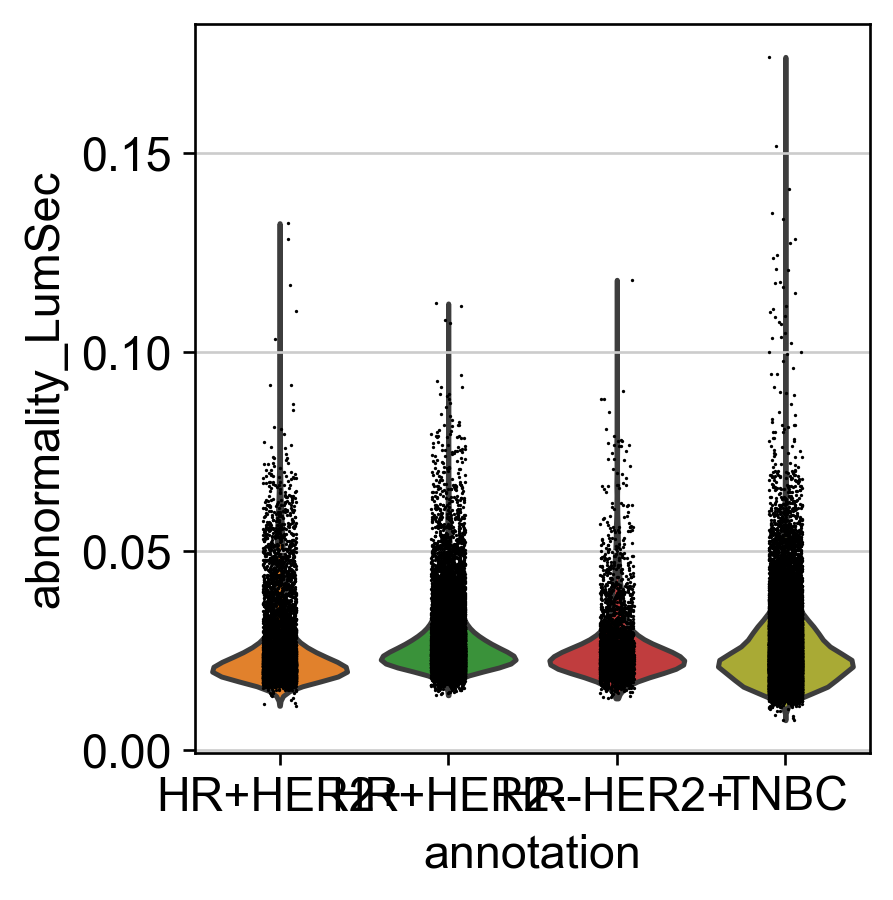

In [258]:
adata_tumor = adata_concat[adata_concat.obs['annotation'].isin(['HR+HER2+', 'HR+HER2-', 'HR-HER2+','TNBC'])]
adata_tumor = adata_tumor[:, adata_tumor.var['highly_variable']]
scdataset = adata_tumor.X.todense()
scdataset = np.asarray(scdataset)
# scaler = MinMaxScaler()
# scdataset = scaler.fit_transform(scdataset)
dataset = torch.from_numpy(np.array(scdataset))
data_loader = Data.DataLoader(dataset=dataset,
                              batch_size=1,
                              shuffle=False)
losses = np.zeros(len(adata_tumor))
with torch.no_grad():
    for i, x in enumerate(data_loader):
        x = x.to(device).view(-1, count_size)
        out, mu, log_var = nmodel(x)
        reconst_loss = F.mse_loss(out, x, reduction='mean')
        kl_div = - 0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())

        loss = reconst_loss + kl_div
        loss = loss.cpu().numpy()
        losses[i] = loss
adata_tumor.obs['abnormality_LumSec'] = losses
sc.pl.violin(adata_tumor, 'abnormality_LumSec', 'annotation')

In [7]:
import omicverse as ov
ov.plot_set()


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.8, Tutorials: https://omicverse.readthedocs.io/
Dependency error: (pydeseq2 0.4.4 (/home/rzh/BCY/lib/python3.10/site-packages), Requirement.parse('pydeseq2<=0.4.0,>=0.3'))


In [ ]:
Traj=ov.single.TrajInfer(adata_concat,basis='X_umap',groupby='annotation',
                         use_rep='X_pca',n_comps=50,)
Traj.set_origin_cells('MaSC')
Traj.inference(method='diffusion_map')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:34)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         1.         0.9999999  0.99955744 0.99929976 0.9992507
     0.9991161  0.9989899  0.9988945  0.99879855 0.9981097  0.9979291
     0.99763596 0.99746865 0.99731654]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:16)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)
drawing single-cell graph using layout 'fa'


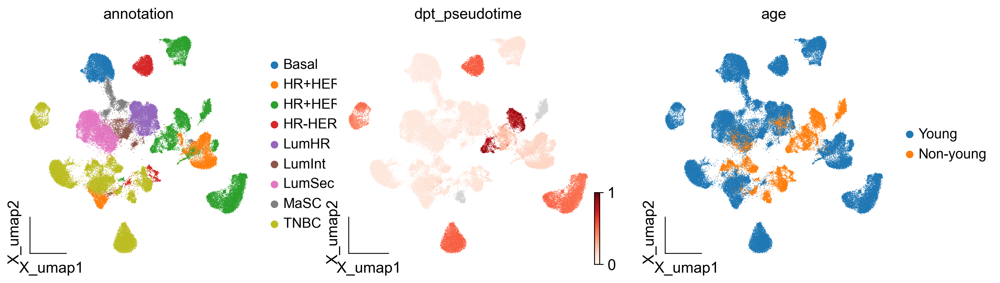

In [25]:
ov.utils.embedding(adata_concat,basis='X_umap',
                   color=['annotation','dpt_pseudotime', 'age'],
                   frameon='small',cmap='Reds')

In [128]:
import pyVIA.core as via
#set parameters for Via 2.0
memory=100 #this is a high memory value and will result in probabilistic pathways that avoid transitioning into unrelated cell populations 
cluster_graph_pruning = 0.15 #level of pruning done on the cluster graph. higher number means less pruning (values can range from 0-3 standard deviations)
edgepruning_clustering_resolution = 0.15  # regulates number of clusters. Higher values means fewer clusters (values can range from 0-3 standard deviations)
random_seed = 42 
knn = 30  # number of neighbors in the knn graph
knn_sequential = 15  # number of neighbors additionally created between sequentially adjacent time points 
n_pcs = 15 # number of principal components
velo_weight = 0  # 0.7 #weight given to velocity based direction compared to pseudotime based direction
t_diff_step = 1 #edges extending between nodes that are more than 2 time steps apart will be removed (i.e. equal to 3 or more time steps apart)
root = ['MaSC'] #for reproducibility, we set the root here. the group level root assignment must correspond to a label that exists in the True-label parameter (must be passed inside a list). For autodetection based on rna-velocity it can be left as None. A single cell index can also be passed e.g. [256], means the 256th cell will be used as a root. Since we will be using the velocity matrices (see below), Via 2.0 will suggest a list of likely root cell states that the user can decide to choose between. It is helpful to examine the top 5 suggested roots and choose the one that seems most reasonable. Note in the output that Via 2.0's suggestions are almost all in the epibliast or Primitive streak state 
neighboring_terminal_states_threshold = 4
max_visual_outgoing_edges = 10#5 #used in differentiation flow chart plots
time_series = True
parc_numeric_cluster_labels = [i for i in adata_concat.obs['leiden-1']]
cluster_celltype_label = [i for i in adata_concat.obs['annotation']]
use_velocity = False
velo_weight = 0.5

if use_velocity:
    gene_matrix =np.asmatrix(adata_concat.layers['Ms'])
    velocity_matrix = np.asmatrix(adata_concat.layers['velocity'])
    velo_weight=velo_weight
else: 
    gene_matrix =None
    velocity_matrix = None
    velo_weight=0
v0 = via.VIA(adata_concat.obsm['X_pca'][:, 0:n_pcs], true_label = cluster_celltype_label,
        edgepruning_clustering_resolution=edgepruning_clustering_resolution,
        edgepruning_clustering_resolution_local=1, knn=knn, memory=memory,
        root_user=root, random_seed=random_seed, dataset='group',
        knn_sequential_reverse=knn_sequential,
        )

In [129]:
from datetime import datetime
print(f'{datetime.now()}\tRun Via2.0')
v0.run_VIA()
print(f'{datetime.now()}\tEnd Via2.0 computation')

2024-12-24 13:29:24.562341	Run Via2.0
2024-12-24 13:29:24.562905	Running VIA over input data of 76216 (samples) x 15 (features)
2024-12-24 13:29:24.562926	Knngraph has 30 neighbors
2024-12-24 13:29:50.060200	Finished global pruning of 30-knn graph used for clustering at level of 0.15. Kept 47.3 % of edges. 
2024-12-24 13:29:50.595050	Number of connected components used for clustergraph  is 1
2024-12-24 13:29:57.014899	Commencing community detection
2024-12-24 13:30:06.163769	Finished community detection. Found 904 clusters.
2024-12-24 13:30:06.187747	Merging 837 very small clusters (<10)
2024-12-24 13:30:06.211875	Finished detecting communities. Found 67 communities
2024-12-24 13:30:06.216260	Making cluster graph. Global cluster graph pruning level: 0.15
2024-12-24 13:30:06.625832	Graph has 1 connected components before pruning
2024-12-24 13:30:06.630087	Graph has 3 connected components after pruning
2024-12-24 13:30:06.632019	Graph has 1 connected components after reconnecting
2024-12

/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build dependencies
   which are reliably pre-installed before running the build tools

  warnings.warn(
/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build de

/home/rzh/BCY/lib/python3.10/site-packages/phate/__init__.py
/home/rzh/BCY/lib/python3.10/site-packages/phate/__init__.py
2024-12-24 13:30:17.766147	Ended all multiprocesses, will retrieve and reshape
2024-12-24 13:30:17.802359	start computing walks with rw2 method


  0%|          | 0/1300 [00:00<?, ?it/s]

memory for rw2 hittings times  2. Using rw2 based pt
2024-12-24 13:30:22.521061	Identifying terminal clusters corresponding to unique lineages...
2024-12-24 13:30:22.521082	Closeness:[0, 1, 3, 4, 5, 9, 11, 13, 14, 16, 19, 24, 29, 31, 42, 43, 45, 46, 47, 49, 54, 58, 61, 62]
2024-12-24 13:30:22.521093	Betweenness:[0, 2, 4, 5, 9, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 31, 34, 35, 36, 37, 39, 40, 41, 42, 43, 46, 48, 49, 50, 53, 54, 55, 56, 61, 62]
2024-12-24 13:30:22.521101	Out Degree:[0, 1, 4, 5, 6, 7, 9, 11, 13, 14, 15, 17, 19, 22, 24, 26, 27, 28, 29, 31, 34, 35, 37, 40, 41, 42, 43, 45, 46, 47, 49, 52, 54, 55, 56, 58, 61, 62]
2024-12-24 13:30:22.521456	Cluster 40 had 3 or more neighboring terminal states [28, 31, 41, 54] and so we removed cluster 41
2024-12-24 13:30:22.521504	Cluster 45 had 3 or more neighboring terminal states [11, 34, 37, 58] and so we removed cluster 37
2024-12-24 13:30:22.521698	Terminal clusters corresponding to unique lineages in this c

  0%|          | 0/1000 [00:00<?, ?it/s]

2024-12-24 13:30:26.883663	0 cluster/state is never reached. try increase number of KNN (which will increase number of edges) or try to increase the value of jac_std_global and cluster_graph_pruning which will lower edge pruning
2024-12-24 13:30:26.973284	Cluster or terminal cell fate 4 is reached 49.0 times
2024-12-24 13:30:27.064913	5 cluster/state is never reached. try increase number of KNN (which will increase number of edges) or try to increase the value of jac_std_global and cluster_graph_pruning which will lower edge pruning
2024-12-24 13:30:27.156677	Cluster or terminal cell fate 9 is reached 7.0 times
2024-12-24 13:30:27.242657	Cluster or terminal cell fate 11 is reached 327.0 times
2024-12-24 13:30:27.334297	Cluster or terminal cell fate 14 is reached 7.0 times
2024-12-24 13:30:27.422944	Cluster or terminal cell fate 17 is reached 84.0 times
2024-12-24 13:30:27.515185	19 cluster/state is never reached. try increase number of KNN (which will increase number of edges) or try t

2024-12-24 13:44:05.235880	Plot Via2.0 cluster graph
tune edges False


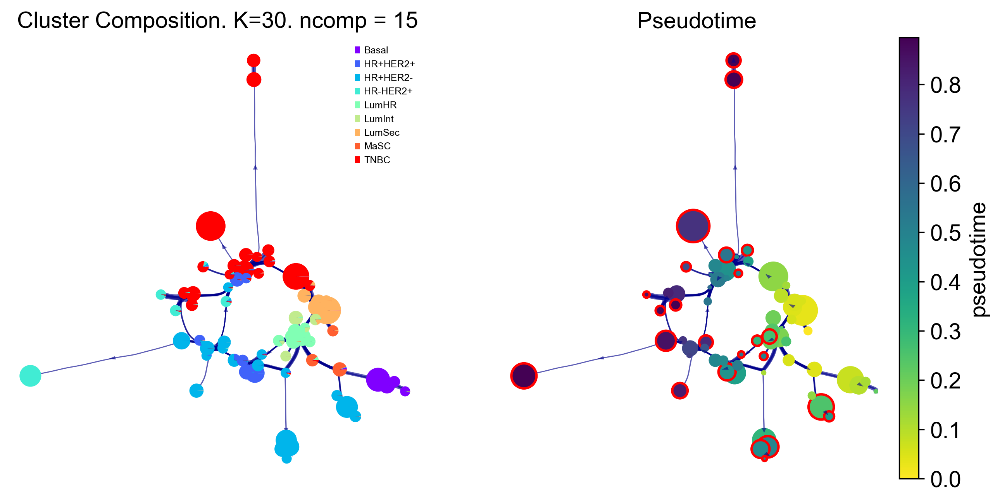

In [140]:
print(f'{datetime.now()}\tPlot Via2.0 cluster graph')

# f, ax, ax1=via.plot_piechart_viagraph(via_object=v0, cmap_piechart='viridis_r', cmap='viridis_r',  reference_labels=cluster_celltype_label, headwidth_arrow=0.4,
#                         highlight_terminal_clusters=True, show_legend=True)
# f.set_size_inches(10, 5)
age_label = [i for i in adata_concat.obs['age']]
study_label = [i for i in adata_concat.obs['study']]
f, ax, ax1=via.plot_piechart_viagraph(via_object=v0, headwidth_arrow=0.4, show_legend=True, ax_text=False, pie_size_scale=0.6, cmap_piechart='rainbow', 
                        highlight_terminal_clusters=True, size_node_notpiechart=0.8)
f.set_size_inches(10, 5)
f.savefig(f'figure-12.9/3h.svg')
# f, ax, ax1= via.plot_piechart_viagraph(via_object=v0, cmap_piechart='jet', cmap='plasma',
#                         reference_labels=cluster_celltype_label, headwidth_arrow=0.4,
#                         highlight_terminal_clusters=True,size_node_notpiechart=0.8)
# f.set_size_inches(10, 5)

Area under curve GATA3 for branch HR-HER2+ is 0.176568206158916
Area under curve GATA3 for branch HR+HER2- is 0.3872179070558066
Area under curve GATA3 for branch HR+HER2+ is 0.2730952357901071
Area under curve GATA3 for branch TNBC is 0.09000237686744708
Area under curve CDH1 for branch HR-HER2+ is 0.168668083387514
Area under curve CDH1 for branch HR+HER2- is 0.25895321576886465
Area under curve CDH1 for branch HR+HER2+ is 0.18702866994599243
Area under curve CDH1 for branch TNBC is 0.1363039095062577
Area under curve ERBB2 for branch HR-HER2+ is 0.09021416342014593
Area under curve ERBB2 for branch HR+HER2- is 0.11880888624019317
Area under curve ERBB2 for branch HR+HER2+ is 0.2726260739390497
Area under curve ERBB2 for branch TNBC is 0.07859523987983913
Area under curve SLC7A2 for branch HR-HER2+ is 0.005861116244419266
Area under curve SLC7A2 for branch HR+HER2- is 0.32068030102687817
Area under curve SLC7A2 for branch HR+HER2+ is 0.09755361150673392
Area under curve SLC7A2 for br

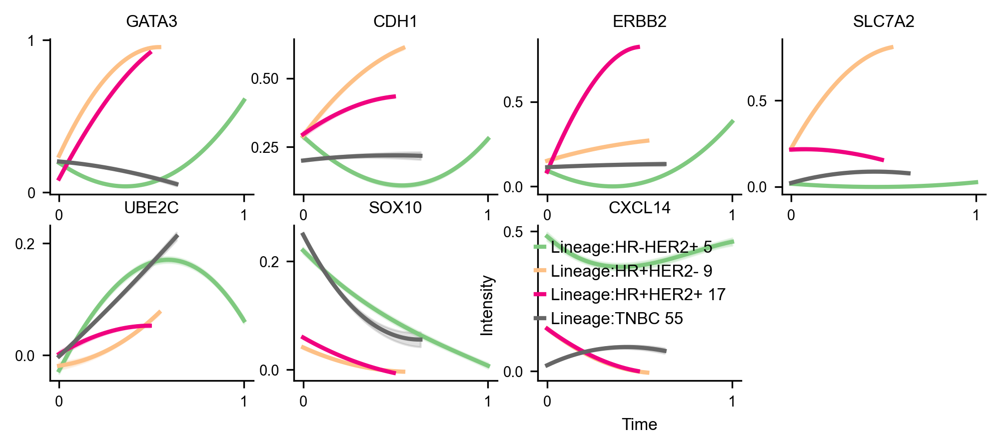

In [209]:
genes=[ 'GATA3', 'CDH1', 'ERBB2', 'SLC7A2','UBE2C','SOX10', 'CXCL14']
df_genes_sc = pd.DataFrame(adata_concat[:, genes].X.todense(), columns=genes)

select_terminal_clusters = [5, 9, 17, 55]
spline_order = 3
n_splines = 4
fig, axs= via.get_gene_expression(via_object=v0, gene_exp=df_genes_sc, marker_genes=genes,
                        marker_lineages=select_terminal_clusters,  # 56,50,25
                        n_splines=n_splines, spline_order=spline_order, cmap='Accent')
print(memory,'q_memory')
fig.set_size_inches(8, 3)
fig.savefig("figure-12.9/3n.svg")

Area under curve SOX10 for branch TNBC is 0.08166492822372023
Area under curve SOX10 for branch HR+HER2- is 0.005547101187367898
Area under curve SOX10 for branch HR-HER2+ is 0.080201371758485
Area under curve SOX10 for branch HR+HER2- is 0.00687932706407661
Area under curve SOX10 for branch HR+HER2- is 0.03211679544267938
Area under curve SOX10 for branch HR+HER2- is 0.006911668725449869
Area under curve SOX10 for branch HR+HER2+ is 0.008449990635457939
Area under curve SOX10 for branch TNBC is 0.08017230086980132
Area under curve SOX10 for branch HR+HER2- is 0.007927015249333848
Area under curve SOX10 for branch TNBC is 0.06645472311307826
Area under curve SOX10 for branch LumHR is 0.02952100770872445
Area under curve SOX10 for branch TNBC is 0.08020831215595792
Area under curve SOX10 for branch HR+HER2- is 0.026658772120748506
Area under curve SOX10 for branch TNBC is 0.04459422105786535
Area under curve SOX10 for branch TNBC is 0.06282409543041106
Area under curve SOX10 for branch 

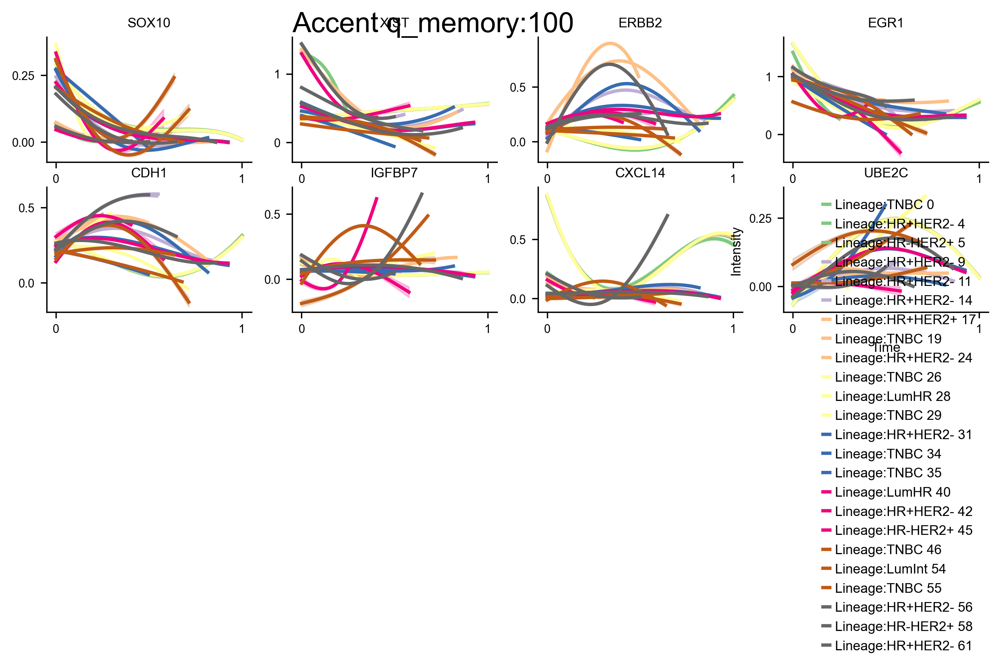

In [204]:
genes=['SOX10','XIST','ERBB2','EGR1', 'CDH1', 'IGFBP7','CXCL14', 'UBE2C']
df_genes_sc = pd.DataFrame(adata_concat[:, genes].X.todense(), columns=genes)

select_terminal_clusters = [5, 9, 11]
spline_order = 3
n_splines = 5
fig, axs= via.get_gene_expression(via_object=v0, gene_exp=df_genes_sc, marker_genes=genes,
                        n_splines=n_splines, spline_order=spline_order, cmap='Accent')
print(memory,'q_memory')
plt.suptitle('Accent q_memory:' + str(memory))
fig.set_size_inches(10, 3)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

2024-12-24 09:11:06.120562	Start Atlas embedding computation
2024-12-24 09:11:06.120715	Plot Atlas Embedding


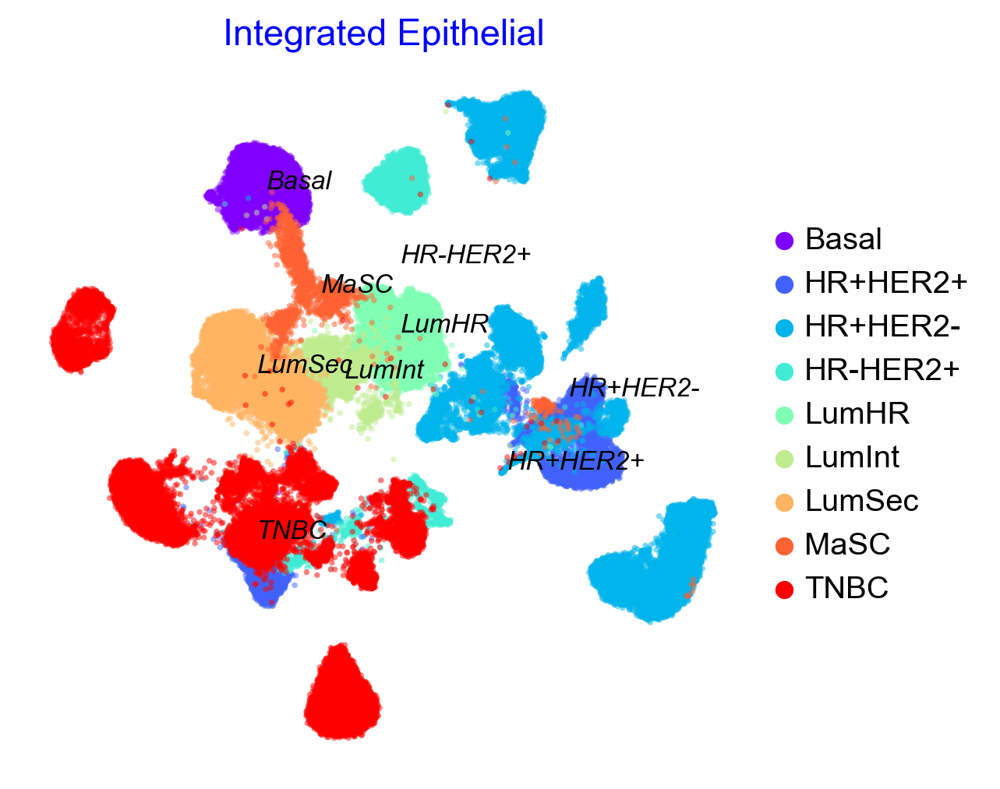

In [91]:
print(f'{datetime.now()}\tStart Atlas embedding computation')
# compute_atlas_embedding = True
# if compute_atlas_embedding:
#     atlas_embedding = via.via_atlas_emb(via_object=v0, init_pos='via', min_dist=0.2, n_components=3)
# else: atlas_embedding = adata_concat.obsm['X_umap']
atlas_embedding = adata_concat.obsm['X_umap']

print(f'{datetime.now()}\tPlot Atlas Embedding')
# f1, ax = via.plot_scatter(embedding=atlas_embedding, labels=parc_numeric_cluster_labels, cmap='plasma', s=5,
#                           alpha=0.5, edgecolors='None',
#                           title='atlas', text_labels=False)
# f1.set_size_inches(10, 10)

f2, ax = via.plot_scatter(embedding=atlas_embedding, labels=cluster_celltype_label, title='Integrated Epithelial',
                          alpha=0.5, s=5)
f2.set_size_inches(5, 5)
f2.savefig("figure-12.9/3j.svg")

head df full     pt celltype
0  1.0     TNBC
1  1.0     TNBC
2  1.0     TNBC
3  1.0     TNBC
4  1.0     TNBC
dict temp Counter({'LumSec': 0.792467332820907, 'MaSC': 0.18472969510632847, 'LumInt': 0.018959774532410965, 'Basal': 0.001921598770176787, 'HR+HER2-': 0.001409172431462977, 'TNBC': 0.0003843197540353574, 'LumHR': 0.00012810658467845247})
dict temp Counter({'Basal': 0.562973086627418, 'LumSec': 0.31307821698906646, 'MaSC': 0.07075273338940286, 'LumInt': 0.0398444070647603, 'LumHR': 0.007674516400336417, 'TNBC': 0.004520605550883095, 'HR+HER2-': 0.0009461732548359966, 'HR+HER2+': 0.00010513036164844407, 'HR-HER2+': 0.00010513036164844407})
dict temp Counter({'Basal': 0.3568953568953569, 'HR+HER2-': 0.2972972972972973, 'TNBC': 0.21968121968121967, 'LumInt': 0.04643104643104643, 'LumSec': 0.035343035343035345, 'LumHR': 0.02564102564102564, 'MaSC': 0.016632016632016633, 'HR+HER2+': 0.002079002079002079})
dict temp Counter({'TNBC': 0.5676069394782148, 'LumHR': 0.27506290557542046, 'L

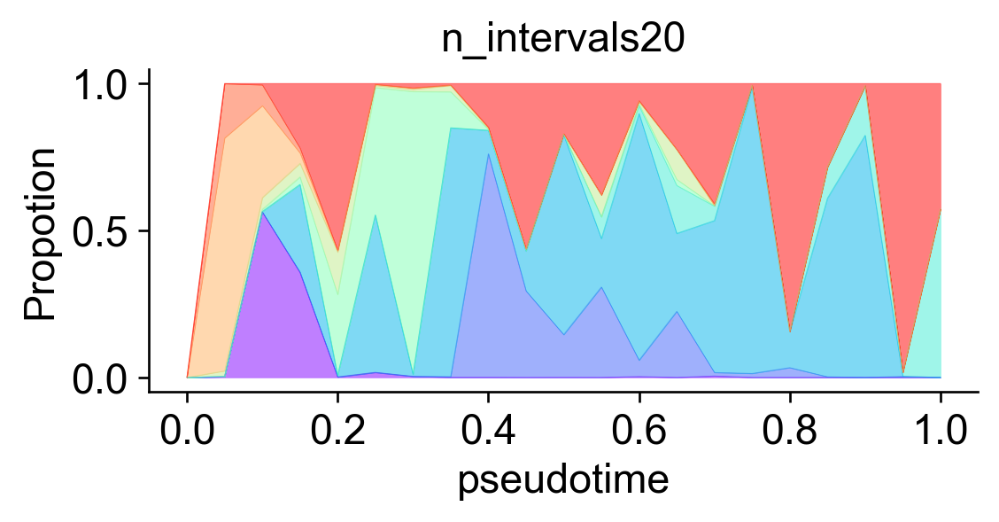

In [161]:
ax = via.plot_population_composition(v0, xlabel='pseudotime', ylabel='Propotion', legend=False,  title='', cmap='rainbow', n_intervals=20)
ax.figure.set_size_inches(5, 2)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.figure.savefig('figure-12.9/3l.svg')

In [211]:
import pickle

with open('v0-2025.1.2.pkl', 'wb') as f:
  pickle.dump(v0, f)

In [58]:
print(f'{datetime.now()}\tCreate edgebundle')
# STEP 1
decay = 0.6  # increasing decay increasing merging of edges
i_bw = 0.02  # increasing bw increases merging of edges
global_visual_pruning = 0.6  # increasing this retains more edges 
v0.embedding = adata_concat.obsm['X_umap'] #pass the embedding we computed into the Via object

import random
pseudorand = random.randint(0, 1000)
n_milestones = 50  
hammerbundle_dict = via.make_edgebundle_milestone(via_object=v0)
v0.hammerbundle_milestone_dict = hammerbundle_dict  # make the hmbd and assign it to the via_object. this can then be used for all plots without having to recompute it

In [ ]:
print(f'{datetime.now()}\tPlot edgebundle')
# STEP 2
fig, ax = via.plot_atlas_view(via_object=v0, decay=decay, initial_bandwidth=i_bw, add_sc_embedding=True, 
                               linewidth_bundle=4, alpha_bundle_factor=1.5, headwidth_bundle=0.2,
                               cmap='rainbow', facecolor='white',
                               n_milestones=30,
                               global_visual_pruning=global_visual_pruning,
                               scale_scatter_size_pop=True, fontsize_labels=16,
                               text_labels=False, sc_labels=cluster_celltype_label, use_sc_labels_sequential_for_direction=True)
fig.set_size_inches(35, 25)


In [ ]:
ov.utils.embedding(adata_concat,basis='X_umap',
                   color=['annotation','dpt_pseudotime'],
                   frameon='small',cmap='Reds')

In [ ]:
adata = sc.read_h5ad("adata-preF.h5ad")
adata

AnnData object with n_obs × n_vars = 76216 × 17269
    obs: 'batch', 'age', 'majorType-fix', 'IHC', 'study', 'annotation'
    var: 'n_cells-Non-young', 'highly_variable-Non-young', 'means-Non-young', 'dispersions-Non-young', 'dispersions_norm-Non-young', 'type-Non-young', 'n_cells_by_counts-Young', 'mean_counts-Young', 'log1p_mean_counts-Young', 'pct_dropout_by_counts-Young', 'total_counts-Young', 'log1p_total_counts-Young', 'n_cells-Young', 'highly_variable-Young', 'means-Young', 'dispersions-Young', 'dispersions_norm-Young', 'symbol-Young', 'ensg-Young', 'chromosome-Young', 'start-Young', 'end-Young', 'n_cells_by_counts-Young-inter', 'mean_counts-Young-inter', 'log1p_mean_counts-Young-inter', 'pct_dropout_by_counts-Young-inter', 'total_counts-Young-inter', 'log1p_total_counts-Young-inter', 'n_cells-Young-inter', 'highly_variable-Young-inter', 'means-Young-inter', 'dispersions-Young-inter', 'dispersions_norm-Young-inter', 'type-Young-inter', 'ID-Young-inter', 'name-Young-inter', 'high

In [3]:
wdata = sc.read_h5ad("New_018.h5ad")
wdata

/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 50000 × 21864
    obs: 'type', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'subtype', 'celltype_subset', 'celltype_minor', 'celltype_major', 'batch', 'mt_frac', 'n_genes', 'n_counts', 'doublet_score', 'predicted_doublet', 'leiden-1', 'UCell_B cells', 'UCell_B cells memory', 'UCell_B cells naive', 'UCell_Basophils', 'UCell_Dendritic cells', 'UCell_Eosinophils', 'UCell_Erythroblasts', 'UCell_Erythroid-like and erythroid precursor cells', 'UCell_Gamma delta T cells', 'UCell_Macrophages', 'UCell_Mast cells', 'UCell_Megakaryocytes', 'UCell_Monocytes', 'UCell_Myeloid-derived suppressor cells', 'UCell_NK cells', 'UCell_Natural killer T cells', 'UCell_Neutrophils', 'UCell_Nuocytes', 'UCell_Plasma cells', 'UCell_Plasmacytoid dendritic cells', 'UCell_Platelets', 'UCell_Red pulp macrophages', 'UCell_Reticulocytes', 'UCell_T cells', 'UCell_T cytotoxic cells', 'UCell_T follicular helper cells', 'UCell_T helper cells', 'UCell_T memory cells', 'UCe

In [4]:
adata_concat = adata_concat.concatenate(
  wdata[wdata.obs['annotation'].isin(['CD4+ T cell', 'CD8+ T cell','Treg','Endothelial'])],
  batch_categories=['Query', 'Reference'], batch_key='CNV')
adata_concat

/tmp/ipykernel_42926/2701374220.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_concat = adata_concat.concatenate(
/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/annda

AnnData object with n_obs × n_vars = 95537 × 17269
    obs: 'batch', 'age', 'majorType-fix', 'IHC', 'study', 'annotation', 'type', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'subtype', 'celltype_subset', 'celltype_minor', 'celltype_major', 'mt_frac', 'n_genes', 'n_counts', 'doublet_score', 'predicted_doublet', 'leiden-1', 'UCell_B cells', 'UCell_B cells memory', 'UCell_B cells naive', 'UCell_Basophils', 'UCell_Dendritic cells', 'UCell_Eosinophils', 'UCell_Erythroblasts', 'UCell_Erythroid-like and erythroid precursor cells', 'UCell_Gamma delta T cells', 'UCell_Macrophages', 'UCell_Mast cells', 'UCell_Megakaryocytes', 'UCell_Monocytes', 'UCell_Myeloid-derived suppressor cells', 'UCell_NK cells', 'UCell_Natural killer T cells', 'UCell_Neutrophils', 'UCell_Nuocytes', 'UCell_Plasma cells', 'UCell_Plasmacytoid dendritic cells', 'UCell_Platelets', 'UCell_Red pulp macrophages', 'UCell_Reticulocytes', 'UCell_T cells', 'UCell_T cytotoxic cells', 'UCell_T follicular helper cells'

In [5]:
sc.pp.normalize_total(adata_concat)
sc.pp.log1p(adata_concat)
sc.pp.highly_variable_genes(adata_concat,min_disp=0.5, n_top_genes=2000)

In [6]:
import infercnvpy as cnv 
import pandas as pd
chrom = pd.read_csv("gene_pos.txt", sep='\t', header=None)
chrom.columns = ["symbol", "ensg", "chromosome", "start", "end"]
chrom.index = chrom['symbol']
chrom['ensg'] = [name.split('.')[0] for name in chrom['ensg']]
chrom_ensg = chrom.copy()
chrom_ensg.index = chrom_ensg['ensg']
var_names = list(adata_concat.var_names[adata_concat.var_names.isin(chrom['symbol']) + adata_concat.var_names.isin(chrom['ensg'])])
adata_epi_var = adata_concat[:, var_names]
adata_epi_var = adata_concat[:, var_names]
for i in range(len(var_names)):
    name = var_names[i]
    if name in chrom_ensg['ensg']:
        var_names[i] = chrom_ensg['symbol'][name]
adata_epi_var.var_names = var_names
chrom_var_names = chrom.loc[var_names, :]
adata_epi_cnv = adata_concat[:, adata_concat.var_names.isin(chrom['symbol']) + adata_concat.var_names.isin(chrom['ensg'])]
adata_epi_cnv.var_names = var_names
adata_epi_cnv.var = pd.concat([adata_epi_var.var, chrom_var_names], axis=1)
adata_epi_cnv.var_names_make_unique()
cnv.tl.infercnv(adata_epi_cnv,reference_key="annotation", reference_cat=['CD4+ T cell', 'CD8+ T cell','Treg','Endothelial'])

/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


  0%|          | 0/20 [00:00<?, ?it/s]

In [ ]:
adata_epi_cnv = adata_epi_cnv[~adata_epi_cnv.obs['annotation'].isin(['CD4+ T cell', 'CD8+ T cell','Treg','Endothelial'])]

View of AnnData object with n_obs × n_vars = 76216 × 17269
    obs: 'batch', 'age', 'majorType-fix', 'IHC', 'study', 'annotation', 'type', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'subtype', 'celltype_subset', 'celltype_minor', 'celltype_major', 'mt_frac', 'n_genes', 'n_counts', 'doublet_score', 'predicted_doublet', 'leiden-1', 'UCell_B cells', 'UCell_B cells memory', 'UCell_B cells naive', 'UCell_Basophils', 'UCell_Dendritic cells', 'UCell_Eosinophils', 'UCell_Erythroblasts', 'UCell_Erythroid-like and erythroid precursor cells', 'UCell_Gamma delta T cells', 'UCell_Macrophages', 'UCell_Mast cells', 'UCell_Megakaryocytes', 'UCell_Monocytes', 'UCell_Myeloid-derived suppressor cells', 'UCell_NK cells', 'UCell_Natural killer T cells', 'UCell_Neutrophils', 'UCell_Nuocytes', 'UCell_Plasma cells', 'UCell_Plasmacytoid dendritic cells', 'UCell_Platelets', 'UCell_Red pulp macrophages', 'UCell_Reticulocytes', 'UCell_T cells', 'UCell_T cytotoxic cells', 'UCell_T follicular helpe

/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/rzh/BCY/lib/python3.10/site-packages/infercnvpy/tl/__init__.py:73: ImplicitModificationWarning: Setting element `.obsm['X_cnv_pca']` of view, initializing view as actual.
  adata.obsm[f"X_{key_added}"] = pca_res
/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/rzh/BCY/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)
/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names a

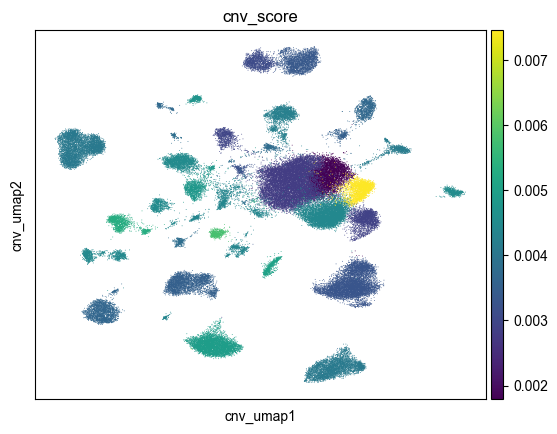

In [9]:
cnv.tl.pca(adata_epi_cnv) 
cnv.pp.neighbors(adata_epi_cnv) 
cnv.tl.leiden(adata_epi_cnv)
cnv.tl.umap(adata_epi_cnv) 
cnv.tl.cnv_score(adata_epi_cnv)
cnv.pl.umap(adata_epi_cnv, color=['cnv_score'])

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


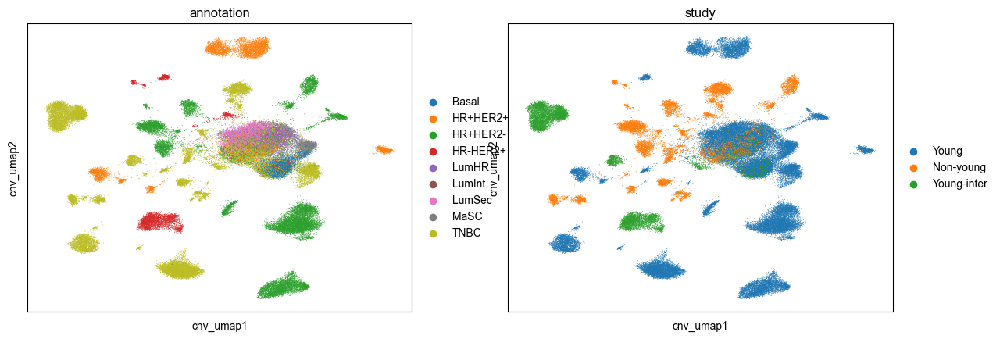

In [13]:
cnv.pl.umap(adata_epi_cnv, color=['annotation', 'study'])

In [41]:
adata_concat.obs['cnv_score'] = list(adata_epi_cnv.obs['cnv_score'])
adata_concat.obs['cnv_status'] = list(adata_epi_cnv.obs['cnv_status'])

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


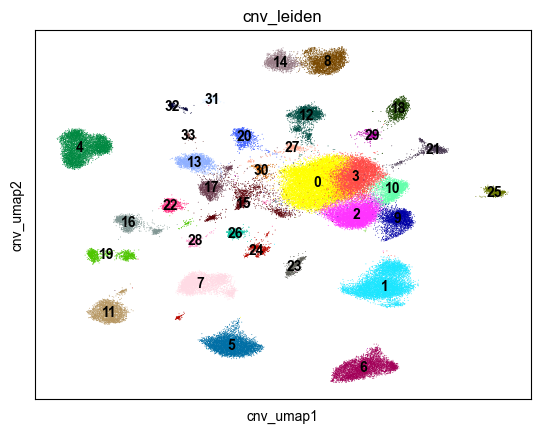

In [14]:
cnv.pl.umap(adata_epi_cnv, color=['cnv_leiden'], legend_loc='on data')

... storing 'cnv_status' as categorical
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


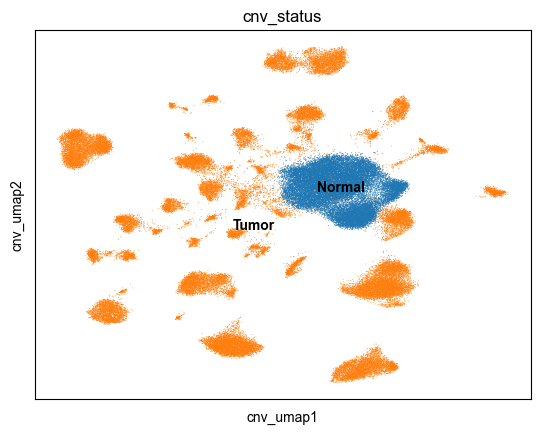

In [20]:
def anno(adata:ad.AnnData, annoDict:dict, obsKey='cnv_status', obsVal='cnv_leiden', default="Unknown"):
  if default is not None:
    adata.obs[obsKey] = default
  for key in annoDict.keys():
    adata.obs.loc[adata.obs[obsVal].isin(annoDict[key]), obsKey] = key
  return adata
annot = {
  "Normal": ['0', '2','3','10'],
}
adata_epi_cnv = anno(adata_epi_cnv, annot, obsKey='cnv_status', obsVal='cnv_leiden', default="Tumor")
annot = {
  "Normal": ['Normal'],
}
adata_epi_cnv = anno(adata_epi_cnv, annot, obsKey='cnv_status', obsVal='annotation', default=None)
cnv.pl.umap(adata_epi_cnv, color=['cnv_status'], legend_loc='on data')

In [37]:
adata_concat

AnnData object with n_obs × n_vars = 95537 × 17269
    obs: 'batch', 'age', 'majorType-fix', 'IHC', 'study', 'annotation', 'type', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'subtype', 'celltype_subset', 'celltype_minor', 'celltype_major', 'mt_frac', 'n_genes', 'n_counts', 'doublet_score', 'predicted_doublet', 'leiden-1', 'UCell_B cells', 'UCell_B cells memory', 'UCell_B cells naive', 'UCell_Basophils', 'UCell_Dendritic cells', 'UCell_Eosinophils', 'UCell_Erythroblasts', 'UCell_Erythroid-like and erythroid precursor cells', 'UCell_Gamma delta T cells', 'UCell_Macrophages', 'UCell_Mast cells', 'UCell_Megakaryocytes', 'UCell_Monocytes', 'UCell_Myeloid-derived suppressor cells', 'UCell_NK cells', 'UCell_Natural killer T cells', 'UCell_Neutrophils', 'UCell_Nuocytes', 'UCell_Plasma cells', 'UCell_Plasmacytoid dendritic cells', 'UCell_Platelets', 'UCell_Red pulp macrophages', 'UCell_Reticulocytes', 'UCell_T cells', 'UCell_T cytotoxic cells', 'UCell_T follicular helper cells'

... storing 'cnv_status' as categorical


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


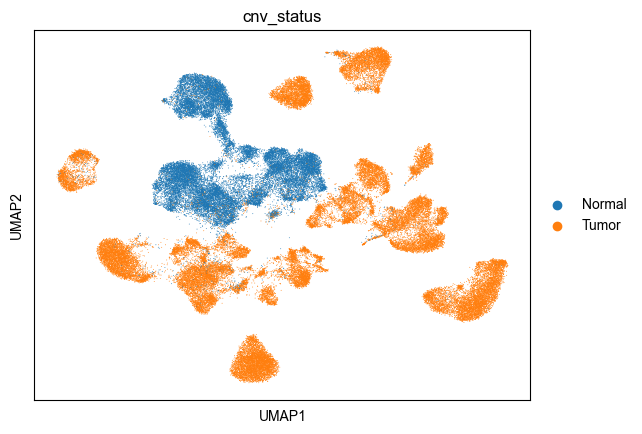

In [42]:
sc.pl.umap(adata_concat, color=['cnv_status'])

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


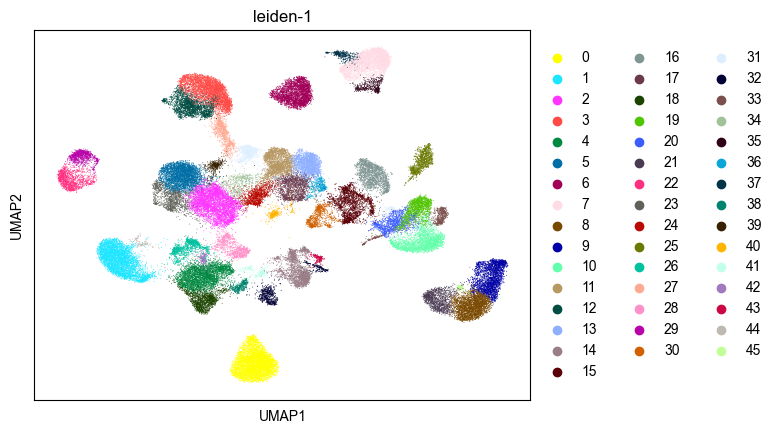

In [45]:
sc.tl.leiden(adata_concat, resolution=2, key_added='leiden-1')
sc.pl.umap(adata_concat, color=['leiden-1'])

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


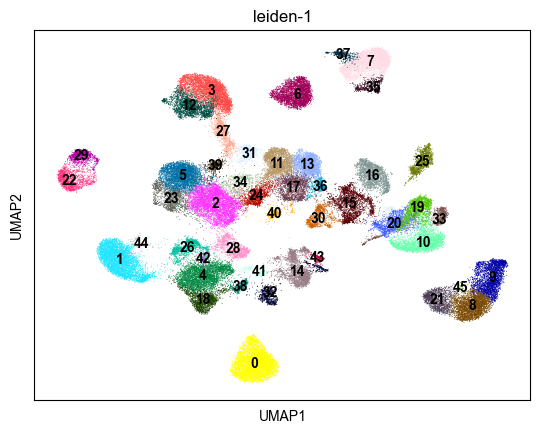

In [46]:
sc.pl.umap(adata_concat, color=['leiden-1'], legend_loc='on data')

In [47]:
adata_concat.obs['ori.annotation'] = adata_concat.obs['annotation']

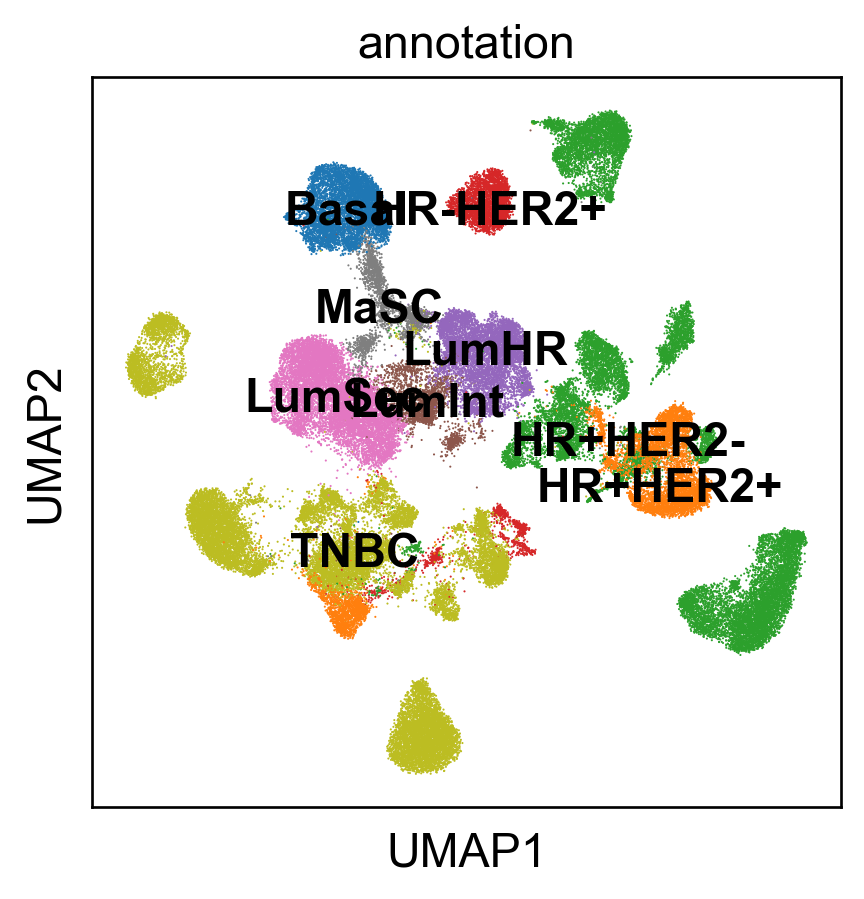

In [127]:
annot = {
  "LumSec": ['2', '5','23'],
  "LumHR":['11', '13', '17', '36'],
  'LumInt':['34', '24', '40'],
  'MaSC':['27', '39'],
  'Basal':['3', '12']
}
adata_concat.obs['annotation'] = adata_concat.obs['ori.annotation']
adata_concat = anno(adata_concat, annot, obsKey='annotation', obsVal='leiden-1', default=None)
sc.pl.umap(adata_concat, color=['annotation'], legend_loc='on data')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


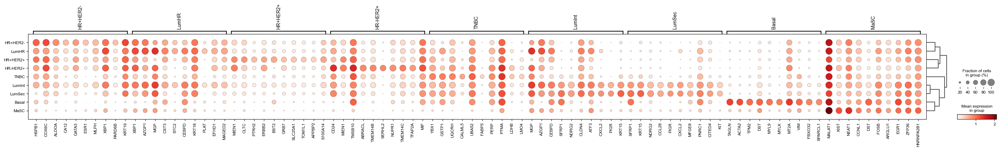

In [60]:
sc.tl.rank_genes_groups(adata_concat, groupby='annotation')
sc.tl.dendrogram(adata_concat, groupby='annotation')
sc.pl.rank_genes_groups_dotplot(adata_concat, n_genes=10)

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


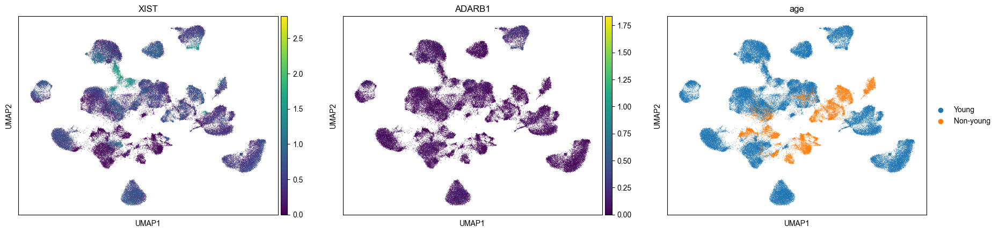

In [64]:
sc.pl.umap(adata_concat, color=['XIST', 'ADARB1', 'age'])

In [53]:
adata_concat.write_h5ad("adata-epi-concat-12.17.h5ad")

adata_concat

In [77]:
sc.tl.paga(adata_concat, groups='annotation')

In [ ]:
sc.pl.clustermap(adata_concat, obs_keys='annotation')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


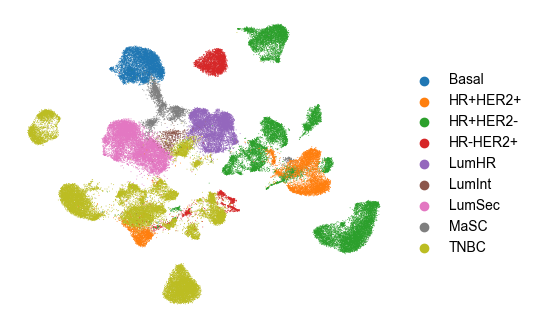

In [65]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))
sc.pl.umap(adata_concat, color=['annotation'], show=False, ax=ax, title='', cmap='Set1')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("")
# ax.legend(  handletextpad=0.5, frameon=False,
#                     borderpad=0.6,
#                     columnspacing=1.3,
#                     handlelength=0.65, fontsize=12)
fig.savefig(f"{figpath}/S3b-epiAnno.png", dpi=400, bbox_inches='tight')


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


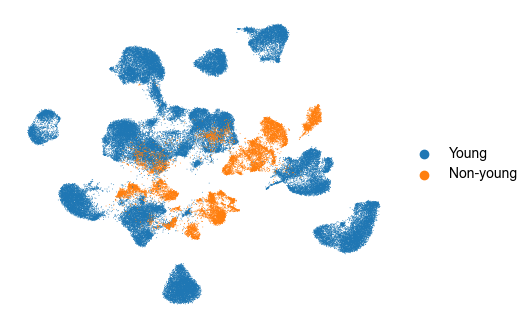

In [439]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))
sc.pl.umap(adata_concat, color=['age'], show=False, ax=ax, title='')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("")
# ax.legend(  handletextpad=0.5, frameon=False,
#                     borderpad=0.6,
#                     columnspacing=1.3,
#                     handlelength=0.65, fontsize=12)
fig.savefig(f"{figpath}/S3b-epiAge.png", dpi=400, bbox_inches='tight')

In [57]:
from volcanoPlot import volcano
import math

In [102]:
def get_pvals(adata, groups):
  names = pd.DataFrame(adata.uns['rank_genes_groups']['names'])[groups]
  lfc = pd.DataFrame(adata.uns['rank_genes_groups']['logfoldchanges'])[groups]
  pvals_adj = pd.DataFrame(adata.uns['rank_genes_groups']['pvals_adj'])[groups]
  pvals = pd.DataFrame(adata.uns['rank_genes_groups']['pvals'])[groups]
  data = pd.concat([names, lfc, pvals, pvals_adj], axis=1)
  data.columns = ['genes', 'log2FC', 'p_value', 'p_adj']
  data.loc[(data.log2FC > 1) & (data.p_value < 0.05), 'type'] = 'up'
  data.loc[(data.log2FC < -1) & (data.p_value < 0.05), 'type'] = 'down'
  data.loc[(abs(data.log2FC) <= 1) | (data.p_value >= 0.05), 'type'] = 'nosig'
  data['sig'] = data['type'].astype('category')
  data['-log10p'] = -(data['p_adj']+10e-20).astype('float').apply(math.log10)
  data.index = data['genes']
  return data

In [103]:
data = get_pvals(adata_concat, 'Young')

In [109]:
adata_concat

AnnData object with n_obs × n_vars = 76216 × 17269
    obs: 'batch', 'age', 'majorType-fix', 'IHC', 'study', 'annotation'
    var: 'n_cells-Non-young', 'highly_variable-Non-young', 'means-Non-young', 'dispersions-Non-young', 'dispersions_norm-Non-young', 'type-Non-young', 'n_cells_by_counts-Young', 'mean_counts-Young', 'log1p_mean_counts-Young', 'pct_dropout_by_counts-Young', 'total_counts-Young', 'log1p_total_counts-Young', 'n_cells-Young', 'highly_variable-Young', 'means-Young', 'dispersions-Young', 'dispersions_norm-Young', 'symbol-Young', 'ensg-Young', 'chromosome-Young', 'start-Young', 'end-Young', 'n_cells_by_counts-Young-inter', 'mean_counts-Young-inter', 'log1p_mean_counts-Young-inter', 'pct_dropout_by_counts-Young-inter', 'total_counts-Young-inter', 'log1p_total_counts-Young-inter', 'n_cells-Young-inter', 'highly_variable-Young-inter', 'means-Young-inter', 'dispersions-Young-inter', 'dispersions_norm-Young-inter', 'type-Young-inter', 'ID-Young-inter', 'name-Young-inter', 'high

In [110]:
adata_concat.write_h5ad("adata-epi-concat-12.6.h5ad")

In [314]:
import os,sys
import PyComplexHeatmap as pch
print(pch.__version__)

1.8.1


In [351]:
import pandas as pd
import numpy as np

def get_topgenes(adata, groupby, n_top=200):
  groups = adata.obs[groupby].unique()
  top_list = []
  for ct in groups:
    top_list.extend(list(pd.DataFrame(adata.uns['rank_genes_groups']['names'])[ct][:n_top]))
  return top_list

def get_degenes(adata, groupby, n_top=200):
  groups = adata.obs[groupby].unique()
  assert len(groups) == 2, 'Please provide two groups'
  up_list = list(pd.DataFrame(adata.uns['rank_genes_groups']['names'])[groups[0]][:n_top])
  down_list = list(pd.DataFrame(adata.uns['rank_genes_groups']['names'])[groups[1]][:n_top])
  down_list.reverse()
  up_list.extend(down_list)
  return up_list

def get_expr(adata, groupby, groups=None, selected_genes=None):
  if groups is None:
    groups = adata.obs[groupby].unique()
  if selected_genes is None:
    selected_genes = adata.var_names
  expr_df = pd.DataFrame(columns=groups)
  for ct in groups:
      adata_cp = adata[:, selected_genes]
      expr = np.array(adata_cp[adata_cp.obs[groupby]==ct].X.mean(axis=0)).flatten()
      expr_df[ct] = expr
  expr_df.index = selected_genes

  frac_df = pd.DataFrame(columns=groups)
  for ct in groups:
      adata_cp = adata[:, selected_genes]
      frac = np.array(np.mean(adata_cp[adata_cp.obs[groupby]==ct].X > 1, axis=0)).flatten()
      frac_df[ct] = frac
  frac_df.index = selected_genes
  return expr_df, frac_df

In [312]:
corr_mt

,Basal,HR+HER2+,HR+HER2-,HR-HER2+,LumHR,LumInt,LumSec,MaSC,TNBC
Basal,1.000000,0.514522,0.481205,0.396965,0.555414,0.684794,0.600933,0.742015,0.584022
HR+HER2+,0.514522,1.000000,0.848288,0.715959,0.774004,0.737939,0.630993,0.554801,0.726740
HR+HER2-,0.481205,0.848288,1.000000,0.748269,0.867372,0.749153,0.596541,0.620922,0.650517
HR-HER2+,0.396965,0.715959,0.748269,1.000000,0.709583,0.652492,0.570736,0.476127,0.725566
LumHR,0.555414,0.774004,0.867372,0.709583,1.000000,0.854007,0.707333,0.726532,0.662667
LumInt,0.684794,0.737939,0.749153,0.652492,0.854007,1.000000,0.848458,0.748278,0.759919
LumSec,0.600933,0.630993,0.596541,0.570736,0.707333,0.848458,1.000000,0.700910,0.738862
MaSC,0.742015,0.554801,0.620922,0.476127,0.726532,0.748278,0.700910,1.000000,0.559315
TNBC,0.584022,0.726740,0.650517,0.725566,0.662667,0.759919,0.738862,0.559315,1.000000


In [384]:
ct_df = pd.DataFrame(list(corr_mt.index), index=corr_mt.index, columns=['Celltype'])

Starting plotting HeatmapAnnotations
Incresing ncol
Incresing ncol
More than 3 cols is not supported
Legend too long, generating a new column..
Incresing ncol


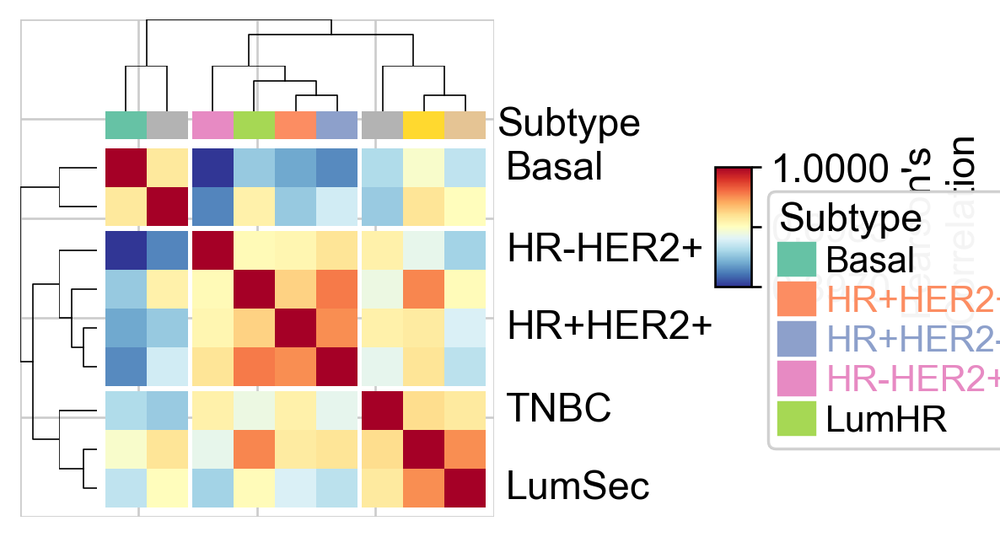

In [396]:
plt.figure(figsize=(3, 2.7))
row_ha = pch.HeatmapAnnotation(Subtype=pch.anno_simple(ct_df.Celltype, cmap='Set2'),
                               legend=True,legend_gap=5,hgap=1,axis=1)
cm = pch.ClusterMapPlotter(data=corr_mt,
                           top_annotation=row_ha,
                    row_cluster=True,
                    col_cluster=True,
                    # z_score=1,
                    row_split=3,
                    row_split_gap=0.5,
                    col_dendrogram=True, 
                      row_dendrogram=True,
                      col_split=3,#row_split=2,
                      col_split_gap=0.5,# row_split_gap=0.8,
                      show_rownames=True,
                      show_colnames=False,
                      row_names_side='left',
                      cmap='RdYlBu_r',
                      label='Pearson\'s \nCorrelation', 
                      tree_kws={'colors':'black'},verbose=0,legend_gap=5,
                      )
plt.savefig('figure-12.9/S3c.svg', bbox_inches='tight')
plt.show()

In [ ]:
ha_df = adata_concat.obs.groupby('batch')['age'].first().reset_index()
ha_df = pd.concat([ha_df, adata_concat.obs.groupby('batch')['IHC'].first().reset_index()['IHC']], axis=1)
ha_df.index = ha_df.batch
ha_df = ha_df.sort_values(by='age')
ha_df

In [349]:
adata_concat.obs['annotation'].cat.categories

Index(['Basal', 'HR+HER2+', 'HR+HER2-', 'HR-HER2+', 'LumHR', 'LumInt',
       'LumSec', 'MaSC', 'TNBC'],
      dtype='object')

In [367]:
la_df = pd.DataFrame(['Benign', 'Malignant', 'Malignant', 'Malignant','Benign','Benign','Benign','Benign','Malignant',],
                     index=['LumSec','TNBC', 'HR+HER2+', 'HR+HER2-', 'LumHR','Basal','LumInt','MaSC','HR-HER2+',])

Starting plotting HeatmapAnnotations


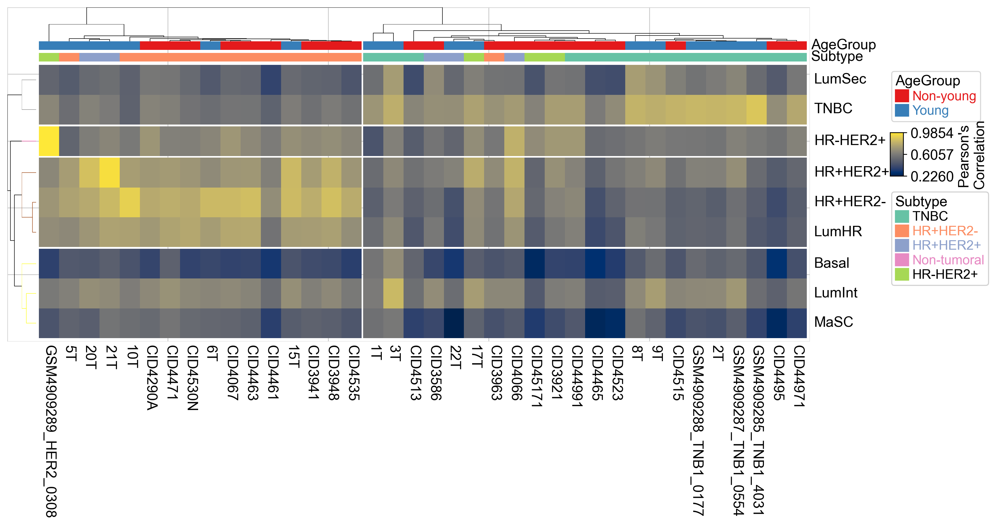

In [371]:
plt.figure(figsize=(14, 5))
col_ha = pch.HeatmapAnnotation(AgeGroup=pch.anno_simple(ha_df.age, cmap='Set1'),
                               Subtype=pch.anno_simple(ha_df.IHC, cmap='Set2'),
                               legend=True,legend_gap=5,hgap=1,axis=1)
row_ha = pch.HeatmapAnnotation(Celltype=pch.anno_simple(la_df, cmap='Set3'),
                               legend=True,legend_gap=5,hgap=1,axis=1)
cm = pch.ClusterMapPlotter(data=corr_df1,
                    top_annotation=col_ha,
                    row_cluster=True,
                    col_cluster=True,
                    # z_score=1,
                    row_split=4,
                    row_split_gap=0.5,
                    col_dendrogram=True, 
                    row_dendrogram=True,
                    col_split=2,#row_split=2,
                    col_split_gap=0.5,# row_split_gap=0.8,
                      show_rownames=True,
                      show_colnames=True,
                      row_names_side='left',
                      cmap='cividis',
                      label='Pearson\'s \nCorrelation', 
                      tree_kws={'row_cmap': 'Set1_r','colors':'black'},verbose=0,legend_gap=5,
                      )
plt.savefig('figure-12.9/S3d.svg')
plt.show()

In [342]:
corr_df1 = corr_df[['1T', '2T', '3T', '5T', '6T', '8T', '9T', '10T',
       '15T',  '17T', '20T', '21T', '22T', 'CID3586', 'CID3921',
       'CID3941', 'CID3948', 'CID3963', 'CID4066',
       'CID4067', 'CID4290A', 'CID4461', 'CID4463', 'CID4465',
       'CID4471', 'CID4495', 'CID4513', 'CID4515', 'CID4523', 'CID4530N',
       'CID4535', 'CID44971', 'CID44991', 'CID45171',
       'GSM4909285_TNB1_4031', 'GSM4909287_TNB1_0554', 'GSM4909288_TNB1_0177',
       'GSM4909289_HER2_0308']]

In [330]:
corr_df.columns

Index(['1T', '2T', '3T', '5N', '5T', '6N', '6T', '8T', '9T', '10N', '10T',
       '12N', '15T', '16N', '17T', '20T', '21T', '22T', 'CID3586', 'CID3921',
       'CID3941', 'CID3946', 'CID3948', 'CID3963', 'CID4040', 'CID4066',
       'CID4067', 'CID4290A', 'CID4398', 'CID4461', 'CID4463', 'CID4465',
       'CID4471', 'CID4495', 'CID4513', 'CID4515', 'CID4523', 'CID4530N',
       'CID4535', 'CID44041', 'CID44971', 'CID44991', 'CID45171',
       'GSM4909285_TNB1_4031', 'GSM4909287_TNB1_0554', 'GSM4909288_TNB1_0177',
       'GSM4909289_HER2_0308'],
      dtype='object')

Starting plotting HeatmapAnnotations


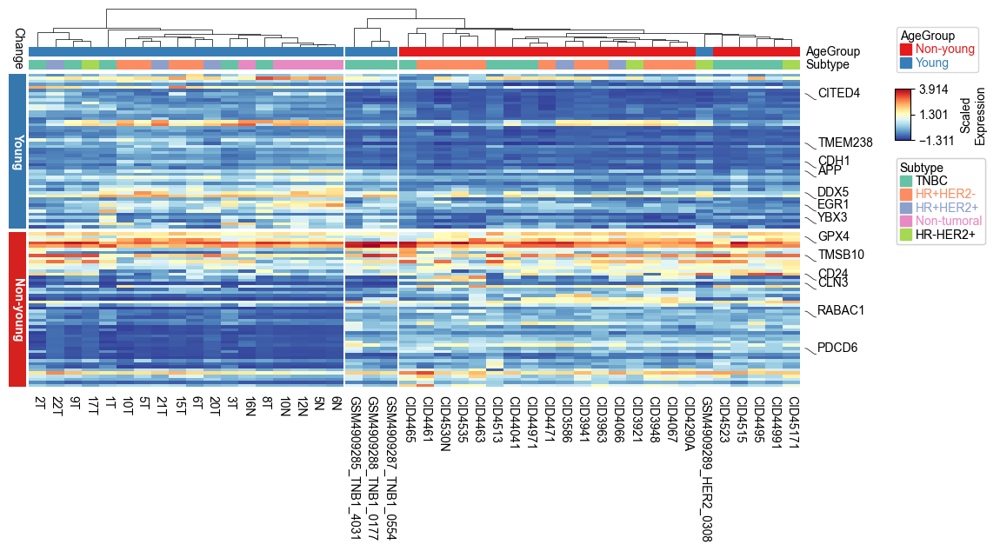

In [444]:
selected_genes = get_degenes(adata_concat, groupby='age', n_top=50)
expr_df, _ = get_expr(adata_concat, groupby='batch', selected_genes=selected_genes)
expr_df = expr_df.drop(['CID4398', 'CID3946', 'CID4040'], axis=1)
ha_df = adata_concat.obs.groupby('batch')['age'].first().reset_index()
ha_df = pd.concat([ha_df, adata_concat.obs.groupby('batch')['IHC'].first().reset_index()['IHC']], axis=1)
ha_df.index = ha_df.batch
ha_df = ha_df.sort_values(by='age')
rank2 = pd.DataFrame(index=expr_df.index, data= ['Young']*50+['Non-young']*50, columns=['Regulation'])
selected_rows = ['CITED4','EGR1','CDH1', 'TMEM238', 'DDX5','TAGLN', 'APP',  'YBX3', 'PDCD6', 'TMSB10', 'CD24','GPX4','CLN3', 'RABAC1']
label_rows = expr_df.apply(lambda x:x.name if x.name in selected_rows else None,axis=1)
plt.figure(figsize=(12, 5))
col_ha = pch.HeatmapAnnotation(AgeGroup=pch.anno_simple(ha_df.age, cmap='Set1'),
                               Subtype=pch.anno_simple(ha_df.IHC, cmap='Set2'),
                               legend=True,legend_gap=5,hgap=1,axis=1)
right_ha = pch.HeatmapAnnotation(
                            selected=pch.anno_label(label_rows,colors='black'),
                            label_side='bottom',
                            axis=0,verbose=0,orientation='right'
                            )
left_ha = pch.HeatmapAnnotation(
                            Change=pch.anno_simple(rank2['Regulation'],colors={'Young': '#3677ad', 'Non-young': '#d5221e'},
                            add_text=True,legend=False,height=5,
                            text_kws={'color':'white', 'fontsize':10,'fontweight':'bold',
                            'rotation':-90,'horizontalalignment':'left'}),
                            axis=0,verbose=0,orientation='right')
cm = pch.ClusterMapPlotter(data=expr_df,
                    top_annotation=col_ha,
                    right_annotation=right_ha,
                    left_annotation=left_ha,
                    row_cluster=True,
                    col_cluster=True,
                    z_score=1,
                    row_split=2,
                    row_split_gap=1,
                    col_dendrogram=True, 
                      row_dendrogram=False,
                      col_split=3,#row_split=2,
                      col_split_gap=0.5,# row_split_gap=0.8,
                      show_rownames=False,
                      show_colnames=True,
                      row_names_side='left',
                      cmap='RdYlBu_r',
                      label='Scaled\nExpression', 
                      tree_kws={'row_cmap': 'Set1_r','colors':'black'},verbose=0,legend_gap=5,
                      )
plt.savefig('figure-12.9/S3a.svg')
plt.show()

In [446]:
selected_genes = get_degenes(adata_concat, groupby='age', n_top=50)
expr_df, _ = get_expr(adata_concat, groupby='age', selected_genes=selected_genes)
ha_df = pd.DataFrame(['Young', 'Non-young'], index=['Young', 'Non-young'], columns=['age'])
rank2 = pd.DataFrame(index=expr_df.index, data= ['Young']*50+['Non-young']*50, columns=['Regulation'])
selected_rows = ['CITED4','EGR1','CDH1', 'TMEM238', 'DDX5','TAGLN', 'APP',  'YBX3', 'PDCD6', 'TMSB10', 'CD24','GPX4','CLN3', 'RABAC1']
label_rows = expr_df.apply(lambda x:x.name if x.name in selected_rows else None,axis=1)

Starting plotting HeatmapAnnotations


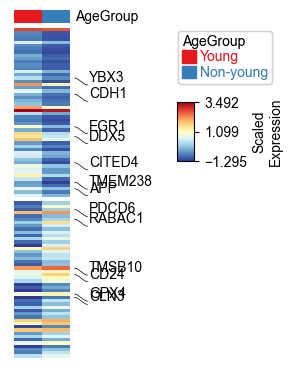

In [449]:
plt.figure(figsize=(1, 4))
col_ha = pch.HeatmapAnnotation(AgeGroup=pch.anno_simple(ha_df.age, cmap='Set1'),
                               legend=True,legend_gap=5,hgap=1,axis=1)
right_ha = pch.HeatmapAnnotation(
                            selected=pch.anno_label(label_rows,colors='black'),
                            label_side='bottom',
                            axis=0,verbose=0,orientation='right'
                            )
# left_ha = pch.HeatmapAnnotation(
#                             Change=pch.anno_simple(rank2['Regulation'],colors={'Young': '#3677ad', 'Non-young': '#d5221e'},
#                             add_text=True,legend=False,height=5,
#                             text_kws={'color':'white', 'fontsize':10,'fontweight':'bold',
#                             'rotation':-90,'horizontalalignment':'left'}),
#                             axis=0,verbose=0,orientation='right')
cm = pch.ClusterMapPlotter(data=expr_df,
                    top_annotation=col_ha,
                    right_annotation=right_ha,
                    # left_annotation=left_ha,
                    row_cluster=True,
                    col_cluster=True,
                    z_score=1,
                    row_split=0,
                    row_split_gap=1,
                    col_dendrogram=False, 
                    row_dendrogram=False,
                    show_rownames=False,
                    show_colnames=False,
                    row_names_side='left',
                    cmap='RdYlBu_r',
                    label='Scaled\nExpression', 
                    tree_kws={'row_cmap': 'Set1_r','colors':'black'},verbose=0,legend_gap=5,
                    )
plt.savefig('figure-12.9/3a.svg')
plt.show()

In [430]:
adata_cnv = sc.read_h5ad("adata-epi-concat-11.26.h5ad")
adata_cnv

/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 66606 × 18547
    obs: 'batch', 'annotation', 'age'
    var: 'n_cells-Non-young', 'highly_variable-Non-young', 'means-Non-young', 'dispersions-Non-young', 'dispersions_norm-Non-young', 'type-Non-young', 'n_cells_by_counts-Young', 'mean_counts-Young', 'log1p_mean_counts-Young', 'pct_dropout_by_counts-Young', 'total_counts-Young', 'log1p_total_counts-Young', 'n_cells-Young', 'highly_variable-Young', 'means-Young', 'dispersions-Young', 'dispersions_norm-Young', 'symbol-Young', 'ensg-Young', 'chromosome-Young', 'start-Young', 'end-Young', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'symbol', 'ensg', 'chromosome', 'start', 'end'
    uns: 'cnv', 'cnv_leiden_colors', 'cnv_neighbors', 'cnv_status_colors', 'hvg', 'leiden', 'log1p', 'rank_genes_groups'
    obsm: 'X_cnv', 'X_cnv_pca', 'X_cnv_umap', 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'cnv_neighbors_connectivities', 'cnv_neighbors_distances'

In [440]:
from scipy.stats import mannwhitneyu
import numpy as np
adata_epi_cnv = adata_cnv
adata_young = adata_epi_cnv[np.array(adata_epi_cnv.obs['age'] == 'Young'), :]
adata_old = adata_epi_cnv[np.array(adata_epi_cnv.obs['age'] == 'Non-young'), :]
adata_young_normal = adata_epi_cnv[np.array(adata_epi_cnv.obs['cnv_status'] == 'Normal') * np.array(adata_epi_cnv.obs['age'] == 'Young'), :]
adata_young_tumor = adata_epi_cnv[np.array(adata_epi_cnv.obs['cnv_status'] == 'Tumor') * np.array(adata_epi_cnv.obs['age'] == 'Young'), :]
adata_old_normal = adata_epi_cnv[np.array(adata_epi_cnv.obs['cnv_status'] == 'Normal') * np.array(adata_epi_cnv.obs['age'] == 'Non-young'), :]
adata_old_tumor = adata_epi_cnv[np.array(adata_epi_cnv.obs['cnv_status'] == 'Tumor') * np.array(adata_epi_cnv.obs['age'] == 'Non-young'), :]

KeyError: 'cnv_status'

In [ ]:
sc.tl.rank_genes_groups(adata_young, groupby='cnv_status', method='wilcoxon')

In [112]:
#Generate example dataset (random)
df = pd.DataFrame(['GroupA'] * 5 + ['GroupB'] * 5, columns=['AB'])
df['CD'] = ['C'] * 3 + ['D'] * 3 + ['G'] * 4
df['EF'] = ['E'] * 6 + ['F'] * 2 + ['H'] * 2
df['F'] = np.random.normal(0, 1, 10)
df.index = ['sample' + str(i) for i in range(1, df.shape[0] + 1)]
df.head()

,AB,CD,EF,F
sample1,GroupA,C,E,0.673228
sample2,GroupA,C,E,0.808408
sample3,GroupA,C,E,0.071217
sample4,GroupA,D,E,-0.216712
sample5,GroupA,D,E,-0.263055


Starting plotting HeatmapAnnotations


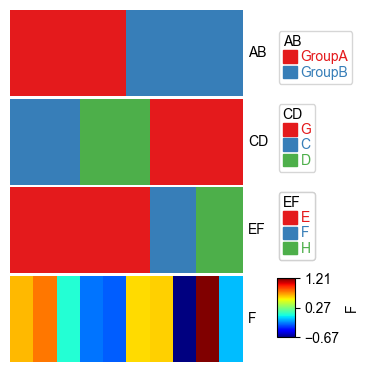

In [113]:
plt.figure(figsize=(3, 4))
col_ha = pch.HeatmapAnnotation(df=df,plot=True,legend=True,legend_gap=5,hgap=0.5,axis=1)
plt.show()

Starting plotting HeatmapAnnotations


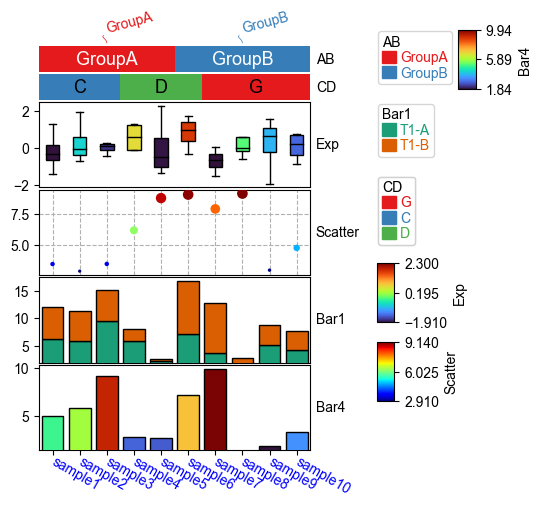

In [114]:
df_box = pd.DataFrame(np.random.randn(10, 4), columns=['Gene' + str(i) for i in range(1, 5)])
df_box.index = ['sample' + str(i) for i in range(1, df_box.shape[0] + 1)]
df_bar = pd.DataFrame(np.random.uniform(0, 10, (10, 2)), columns=['TMB1', 'TMB2'])
df_bar.index = ['sample' + str(i) for i in range(1, df_box.shape[0] + 1)]
df_scatter = pd.DataFrame(np.random.uniform(0, 10, 10), columns=['Scatter'])
df_scatter.index = ['sample' + str(i) for i in range(1, df_box.shape[0] + 1)]
df_bar1 = pd.DataFrame(np.random.uniform(0, 10, (10, 2)), columns=['T1-A', 'T1-B'])
df_bar1.index = ['sample' + str(i) for i in range(1, df_box.shape[0] + 1)]
df_bar4 = pd.DataFrame(np.random.uniform(0, 10, (10, 1)), columns=['T4'])
df_bar4.index = ['sample' + str(i) for i in range(1, df_box.shape[0] + 1)]
df_bar4.iloc[7,0]=np.nan

plt.figure(figsize=(3.5, 5))
col_ha = pch.HeatmapAnnotation(label=pch.anno_label(df.AB, merge=True,rotation=15),
                            AB=pch.anno_simple(df.AB,add_text=True,legend=True), axis=1,
                            CD=pch.anno_simple(df.CD, add_text=True,legend=True,text_kws={'color':'black'}),
                            Exp=pch.anno_boxplot(df_box, cmap='turbo',legend=True),
                            Scatter=pch.anno_scatterplot(df_scatter,grid=True),
                           Bar1=pch.anno_barplot(df_bar1,legend=True,cmap='Dark2'),
                           Bar4=pch.anno_barplot(df_bar4,legend=True,cmap='turbo'),
                           plot=True,legend=True,legend_gap=5,hgap=0.5)
col_ha.show_ticklabels(df.index.tolist(),fontdict={'color':'blue'},rotation=-30)
plt.show()

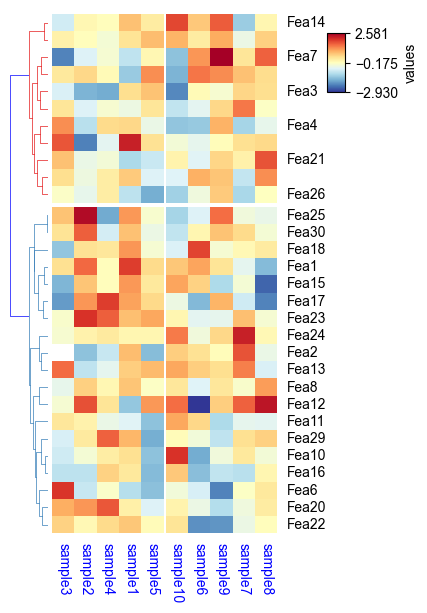

In [115]:
df_heatmap = pd.DataFrame(np.random.randn(30, 10), columns=['sample' + str(i) for i in range(1, 11)])
df_heatmap.index = ["Fea" + str(i) for i in range(1, df_heatmap.shape[0] + 1)]
df_heatmap.iloc[1, 2] = np.nan

plt.figure(figsize=(3.5, 6))
cm = pch.ClusterMapPlotter(data=df_heatmap,
                       col_cluster=True,row_cluster=True,
                       col_split=df.AB,row_split=2,
                       col_split_gap=0.5,row_split_gap=0.8,
                       label='values',row_dendrogram=True,
                       show_rownames=True,show_colnames=True,
                       row_names_side='right',
                       tree_kws={'row_cmap': 'Set1','colors':'blue'},verbose=0,legend_gap=5,
                       cmap='RdYlBu_r',xticklabels_kws={'labelrotation':-90,'labelcolor':'blue'})
plt.savefig("example0.pdf", bbox_inches='tight')
plt.show()

In [238]:
df.AB

sample1     GroupA
sample2     GroupA
sample3     GroupA
sample4     GroupA
sample5     GroupA
sample6     GroupB
sample7     GroupB
sample8     GroupB
sample9     GroupB
sample10    GroupB
Name: AB, dtype: object

In [199]:
expr_df.T

,Young,Non-young
CD81,0.482213,0.109022
TMEM238,0.245133,0.004214
GNAS,0.754022,0.48486
CEBPD,0.573264,0.250607
JUND,0.543862,0.250701
...,...,...
CHMP4B,0.151069,0.290795
ERH,0.39352,0.553895
GGPS1,0.041033,0.145535
ACTB,1.180918,1.319236


Starting plotting HeatmapAnnotations


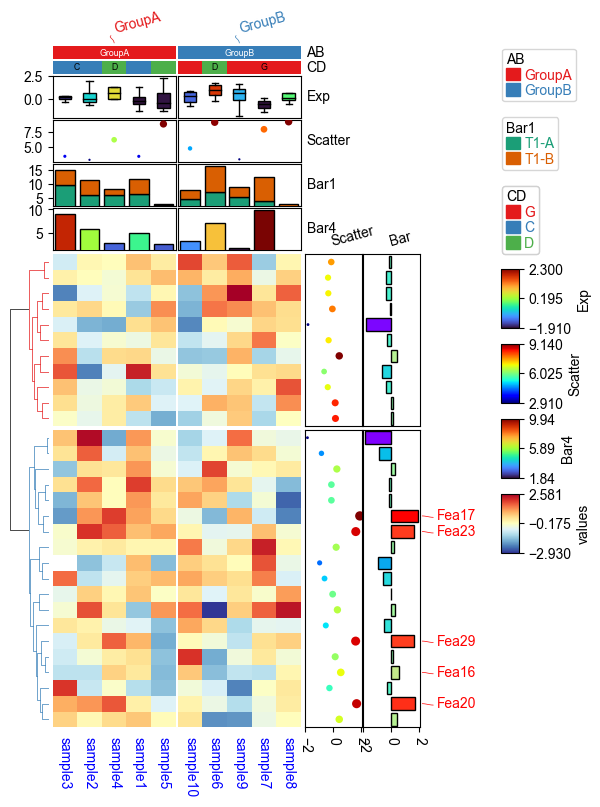

In [116]:
df_rows = df_heatmap.apply(lambda x:x.name if x.sample4 > 0.5 else None,axis=1)
df_rows=df_rows.to_frame(name='Selected')
df_rows['XY']=df_rows.index.to_series().apply(lambda x:'A' if int(x.replace('Fea',''))>=15 else 'B')

col_ha = pch.HeatmapAnnotation(label=pch.anno_label(df.AB, merge=True,rotation=15),
                            AB=pch.anno_simple(df.AB,add_text=True,legend=True), axis=1,
                            CD=pch.anno_simple(df.CD, add_text=True,legend=True,text_kws={'color':'black'}),
                            Exp=pch.anno_boxplot(df_box, cmap='turbo',legend=True),
                            Scatter=pch.anno_scatterplot(df_scatter),
                           Bar1=pch.anno_barplot(df_bar1,legend=True,cmap='Dark2'),
                           Bar4=pch.anno_barplot(df_bar4,legend=True,cmap='turbo'),
                           legend=True,legend_gap=5,hgap=0.5)

row_ha = pch.HeatmapAnnotation(
                           Scatter=pch.anno_scatterplot(df_heatmap.sample4.apply(lambda x:round(x,2)),
                                            height=15,cmap='jet',legend=False),
                           Bar=pch.anno_barplot(df_heatmap.sample4.apply(lambda x:round(x,2)),
                                            height=15,cmap='rainbow',legend=False),
                           selected=pch.anno_label(df_rows,colors='red',relpos=(-0.05,0.4)),
                           label_kws={'rotation':15,'horizontalalignment':'left','verticalalignment':'bottom'},
                            axis=0,verbose=0)

plt.figure(figsize=(5.5, 8))
cm = pch.ClusterMapPlotter(data=df_heatmap, top_annotation=col_ha,right_annotation=row_ha,
                       col_cluster=True,row_cluster=True,
                       col_split=df.AB,row_split=2,
                       col_split_gap=0.5,row_split_gap=0.8,
                       label='values',row_dendrogram=True,
                       show_rownames=False,show_colnames=True,
                       tree_kws={'row_cmap': 'Set1'},verbose=0,legend_gap=5,
                       cmap='RdYlBu_r',xticklabels_kws={'labelrotation':-90,'labelcolor':'blue'})
plt.savefig("example0.pdf", bbox_inches='tight')
plt.show()